<a href="https://colab.research.google.com/github/lucasfranca016/BootcampDataScience/blob/main/modulo3/mod3_aula5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from datetime import datetime as dt
from datetime import timedelta
from matplotlib.dates import MonthLocator, DateFormatter
from pandas.plotting import autocorrelation_plot
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.sm_exceptions import ConvergenceWarning
import statsmodels.tsa.stattools as smt
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot
from sklearn.metrics import mean_absolute_error,r2_score,median_absolute_error,explained_variance_score
from sklearn.metrics import accuracy_score
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric

In [ ]:
dados = pd.read_csv('dados_covid_sp.csv',sep = ';')

In [ ]:
dados.head()

,nome_munic,codigo_ibge,dia,mes,datahora,casos,casos_novos,casos_pc,casos_mm7d,obitos,...,nome_drs,cod_drs,pop,pop_60,area,map_leg,map_leg_s,latitude,longitude,semana_epidem
0,Adamantina,3500105,25,2,2020-02-25,0,0,"0,000000e+00","0,0000000",0,...,Marília,5,33894,7398,41199,0,8.0,"-21,6820","-51,0737",9
1,Adolfo,3500204,25,2,2020-02-25,0,0,"0,000000e+00","0,0000000",0,...,São José do Rio Preto,15,3447,761,21106,0,8.0,"-21,2325","-49,6451",9
2,Aguaí,3500303,25,2,2020-02-25,0,0,"0,000000e+00","0,0000000",0,...,São João da Boa Vista,14,35608,5245,47455,0,8.0,"-22,0572","-46,9735",9
3,Águas da Prata,3500402,25,2,2020-02-25,0,0,"0,000000e+00","0,0000000",0,...,São João da Boa Vista,14,7797,1729,14267,0,8.0,"-21,9319","-46,7176",9
4,Águas de Lindóia,3500501,25,2,2020-02-25,0,0,"0,000000e+00","0,0000000",0,...,Campinas,3,18374,3275,6013,0,8.0,"-22,4733","-46,6314",9


In [ ]:
dados['datahora'] = pd.to_datetime(dados['datahora'], format='%Y-%m-%d')

In [ ]:
mpl.rcParams['font.size'] = 18
mpl.rcParams['figure.figsize'] = (15,8)

<AxesSubplot:xlabel='datahora', ylabel='casos'>

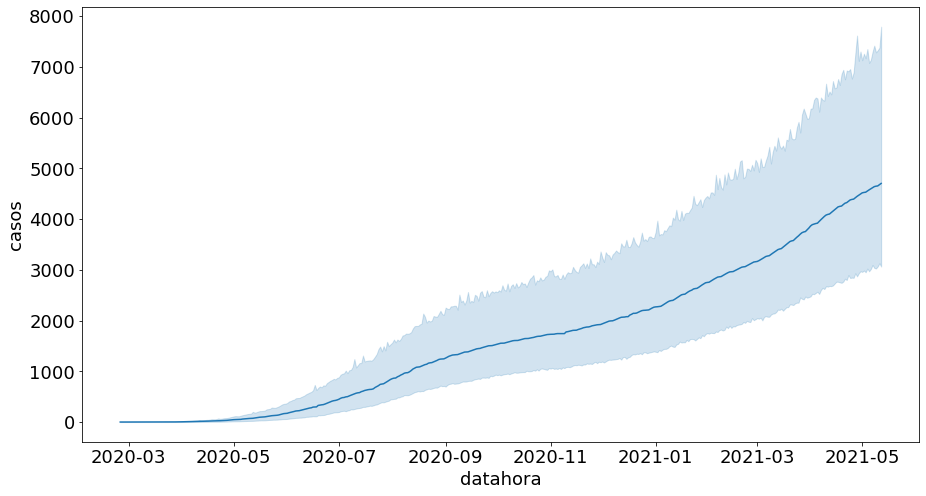

In [ ]:
sns.lineplot(x='datahora', y='casos',data=dados)

In [ ]:
eixo_x = np.linspace(-2, 2, 100)

In [ ]:
y_exp = np.exp(eixo_x)

<AxesSubplot:>

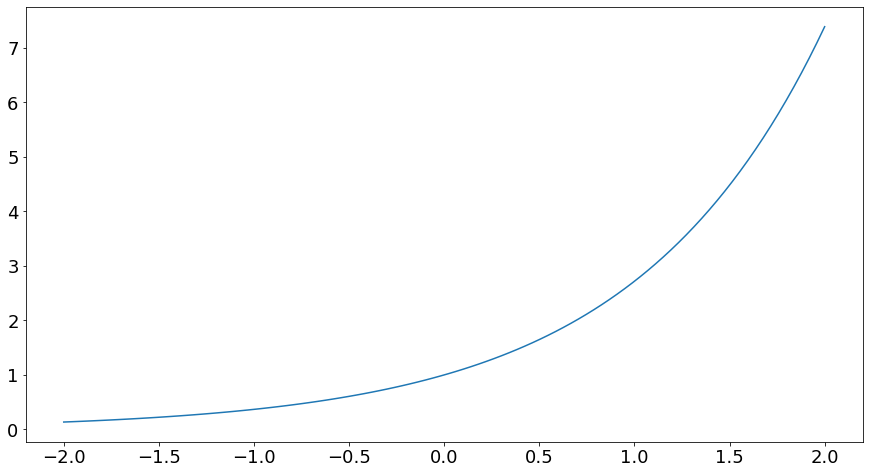

In [ ]:
sns.lineplot(x = eixo_x, y=y_exp)

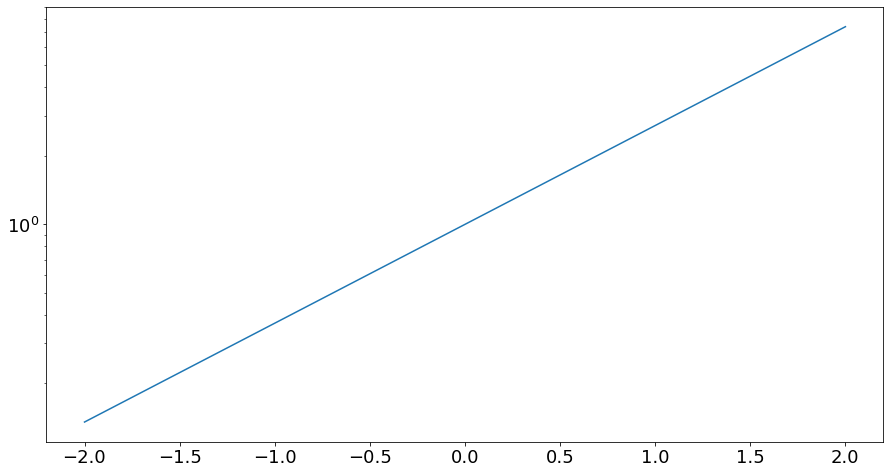

In [ ]:
sns.lineplot(x=eixo_x, y=y_exp)
mpl.pyplot.yscale('log')

In [ ]:
dados_sp = dados.query('nome_munic == "São Paulo"')

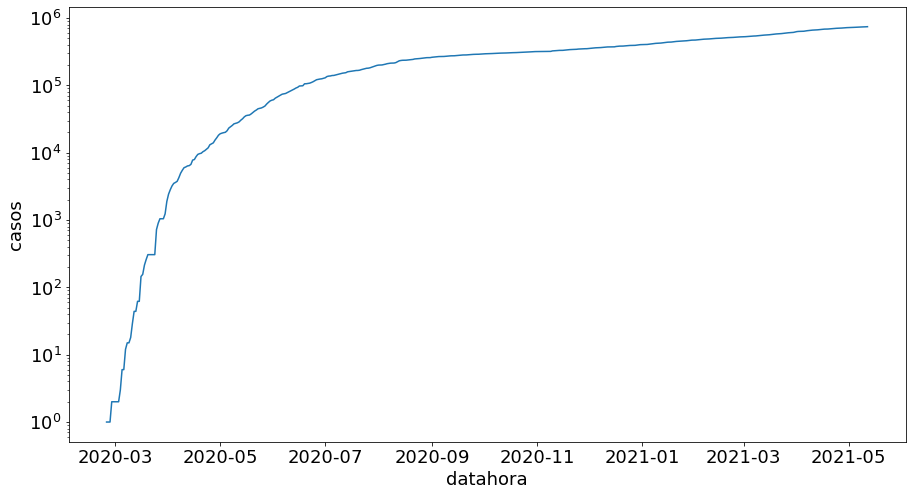

In [ ]:
sns.lineplot(x='datahora',y='casos',data=dados_sp)
mpl.pyplot.yscale('log')

# Desafio 1 : Filtrar a base com alguma outra função

# Desafio 2 : Escolher outro município para fazer a análise.

In [ ]:
#Desafio 1:

dados_jund = dados[dados['nome_munic'].eq('Jundiaí')]
dados_jund

,nome_munic,codigo_ibge,dia,mes,datahora,casos,casos_novos,casos_pc,casos_mm7d,obitos,...,nome_drs,cod_drs,pop,pop_60,area,map_leg,map_leg_s,latitude,longitude,semana_epidem
293,Jundiaí,3525904,25,2,2020-02-25,0,0,"0,000000e+00","0,0000000",0,...,Campinas,3,407016,69839,43121,0,8.0,"-23,1852","-46,8974",9
938,Jundiaí,3525904,26,2,2020-02-26,0,0,"0,000000e+00","0,0000000",0,...,Campinas,3,407016,69839,43121,0,8.0,"-23,1852","-46,8974",9
1583,Jundiaí,3525904,27,2,2020-02-27,0,0,"0,000000e+00","0,0000000",0,...,Campinas,3,407016,69839,43121,0,8.0,"-23,1852","-46,8974",9
2228,Jundiaí,3525904,28,2,2020-02-28,0,0,"0,000000e+00","0,0000000",0,...,Campinas,3,407016,69839,43121,0,8.0,"-23,1852","-46,8974",9
2873,Jundiaí,3525904,29,2,2020-02-29,0,0,"0,000000e+00","0,0000000",0,...,Campinas,3,407016,69839,43121,0,8.0,"-23,1852","-46,8974",9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282803,Jundiaí,3525904,8,5,2021-05-08,36058,81,"8,859111e+03","110,2857143",1073,...,Campinas,3,407016,69839,43121,>5000,1.0,"-23,1852","-46,8974",18
283448,Jundiaí,3525904,9,5,2021-05-09,36232,174,"8,901861e+03","119,2857143",1079,...,Campinas,3,407016,69839,43121,>5000,1.0,"-23,1852","-46,8974",19
284093,Jundiaí,3525904,10,5,2021-05-10,36252,20,"8,906775e+03","117,0000000",1083,...,Campinas,3,407016,69839,43121,>5000,1.0,"-23,1852","-46,8974",19
284738,Jundiaí,3525904,11,5,2021-05-11,36393,141,"8,941418e+03","121,2857143",1089,...,Campinas,3,407016,69839,43121,>5000,1.0,"-23,1852","-46,8974",19


<AxesSubplot:xlabel='datahora', ylabel='casos'>

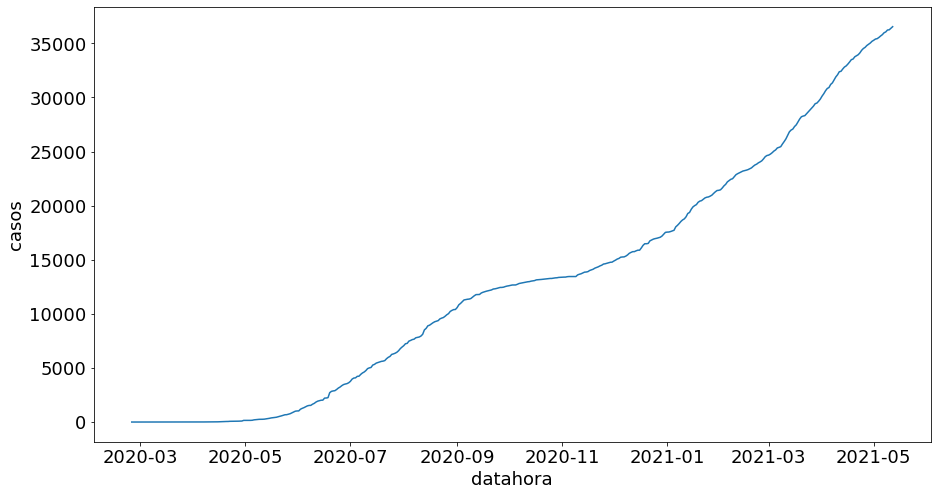

In [ ]:
#Desafio 2:

sns.lineplot(x='datahora',y='casos',data=dados_jund)

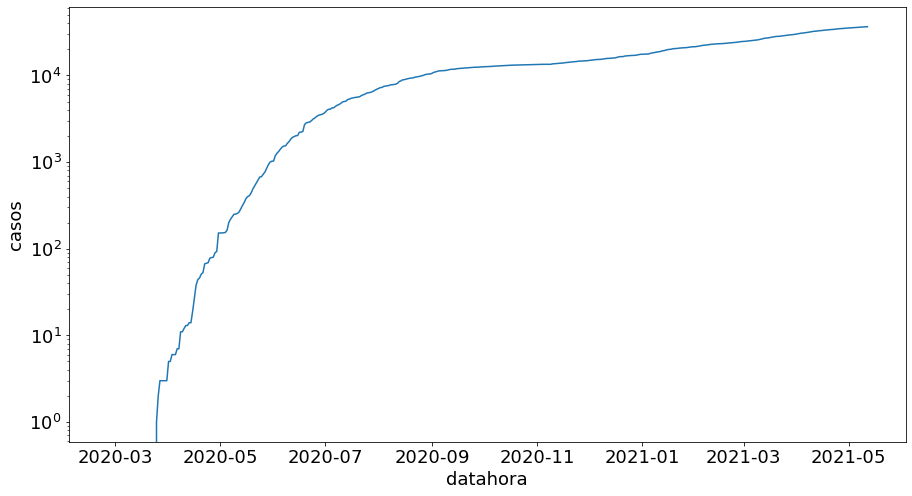

In [ ]:
sns.lineplot(x='datahora',y='casos',data=dados_jund)
mpl.pyplot.yscale('log')

<AxesSubplot:xlabel='datahora', ylabel='casos_novos'>

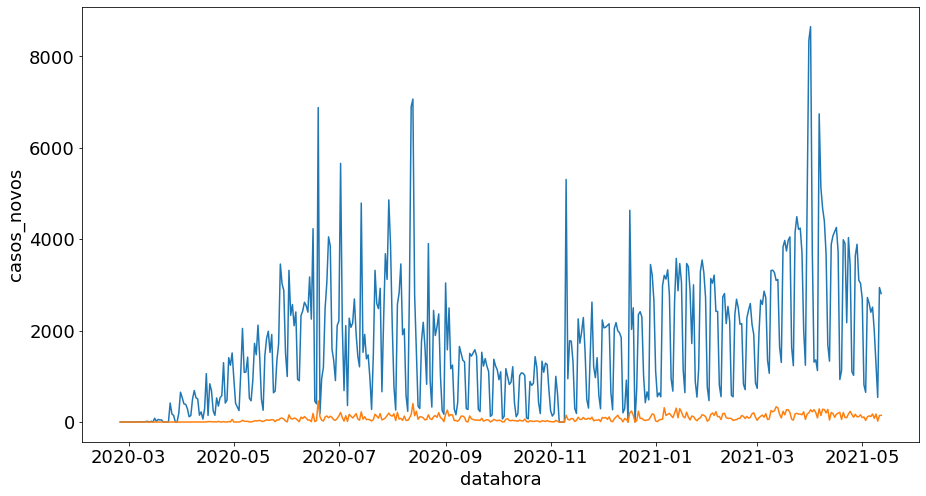

In [ ]:
sns.lineplot(x='datahora', y='casos_novos', data=dados_sp)
sns.lineplot(x='datahora', y='casos_novos', data=dados_jund)

<AxesSubplot:xlabel='datahora', ylabel='casos_novos'>

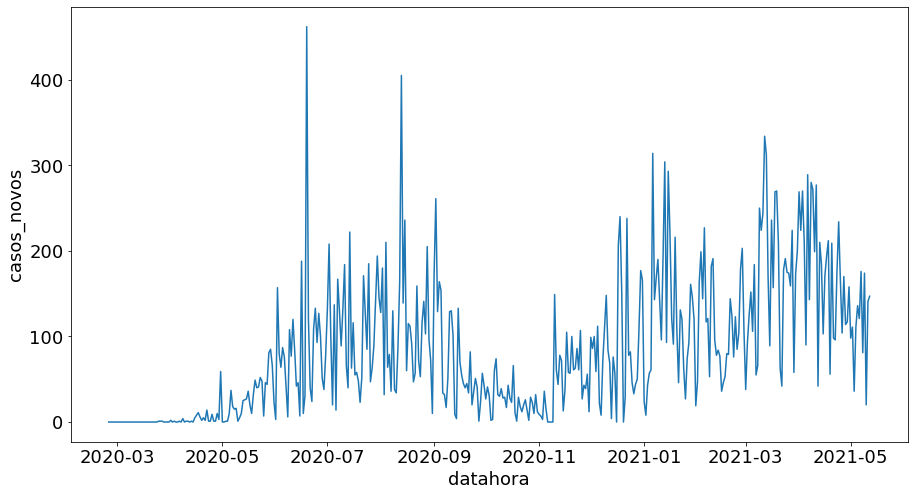

In [ ]:
sns.lineplot(x='datahora', y='casos_novos', data=dados_jund)

In [ ]:
#diferenciação:
dados_exemplo = pd.DataFrame(data = np.linspace(1,10,10))
dados_exemplo.head()

,0
0,1.0
1,2.0
2,3.0
3,4.0
4,5.0


<AxesSubplot:xlabel='0', ylabel='0'>

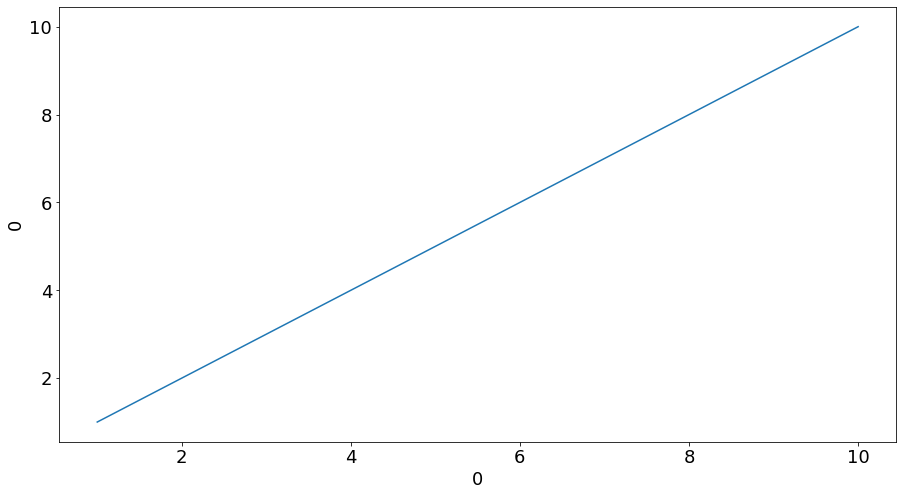

In [ ]:
sns.lineplot(data=dados_exemplo, x=dados_exemplo[0], y=dados_exemplo[0])

In [ ]:
dados_exemplo['diferenciado'] = dados_exemplo.diff()

<AxesSubplot:xlabel='0', ylabel='0'>

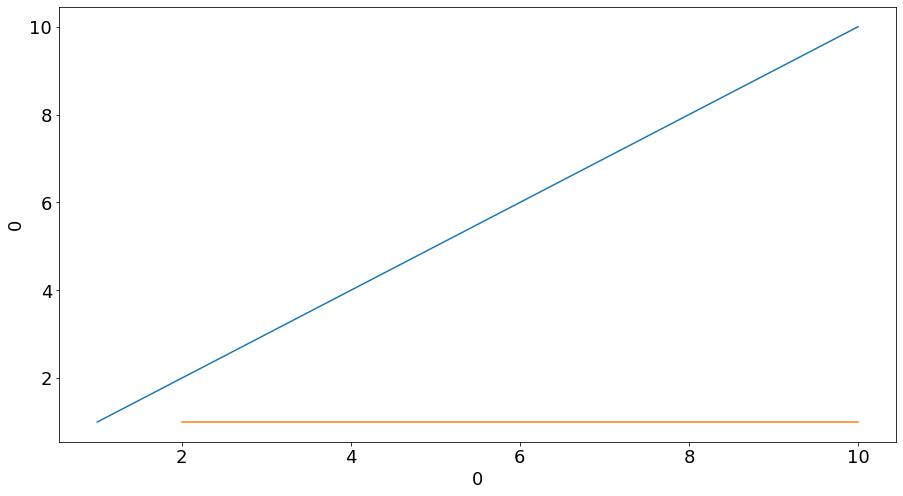

In [ ]:
sns.lineplot(data=dados_exemplo, x=dados_exemplo[0], y=dados_exemplo[0])
sns.lineplot(data=dados_exemplo, x=dados_exemplo[0], y='diferenciado')

In [ ]:
dados_sp.loc[:,'derivada_casos'] = dados_sp.loc[:,'casos_novos'].diff()
dados_sp.loc[:,'derivada_obitos'] = dados_sp.loc[:,'obitos_novos'].diff()
dados_jund.loc[:,'derivada_casos'] = dados_jund.loc[:,'casos_novos'].diff()
dados_jund.loc[:,'derivada_obitos'] = dados_jund.loc[:,'obitos_novos'].diff()

/home/lulu/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/home/lulu/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1745: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


<AxesSubplot:xlabel='datahora', ylabel='derivada_casos'>

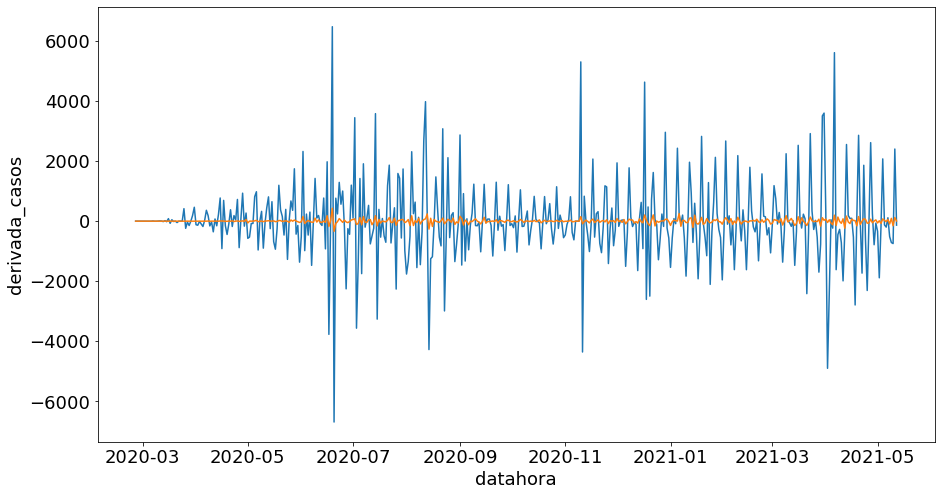

In [ ]:
sns.lineplot(x='datahora', y='derivada_casos', data=dados_sp)
sns.lineplot(x='datahora', y='derivada_casos', data=dados_jund)

<AxesSubplot:xlabel='datahora', ylabel='derivada_casos'>

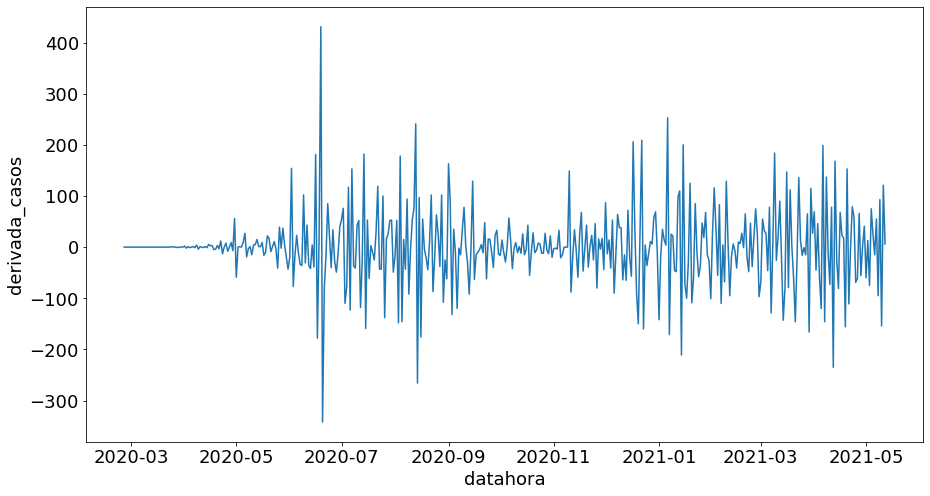

In [ ]:
sns.lineplot(x='datahora', y='derivada_casos', data=dados_jund)

<AxesSubplot:xlabel='datahora', ylabel='derivada_obitos'>

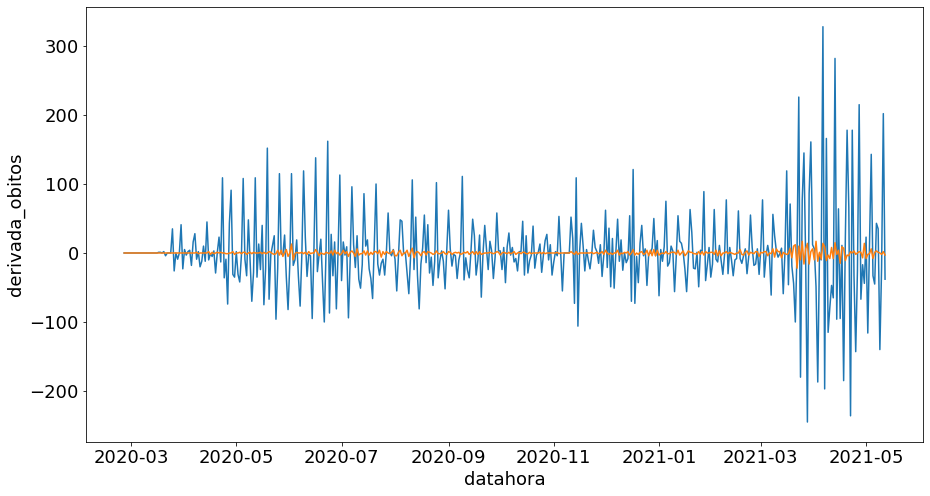

In [ ]:
sns.lineplot(x='datahora', y='derivada_obitos', data=dados_sp)
sns.lineplot(x='datahora', y='derivada_obitos', data=dados_jund)

<AxesSubplot:xlabel='datahora', ylabel='derivada_obitos'>

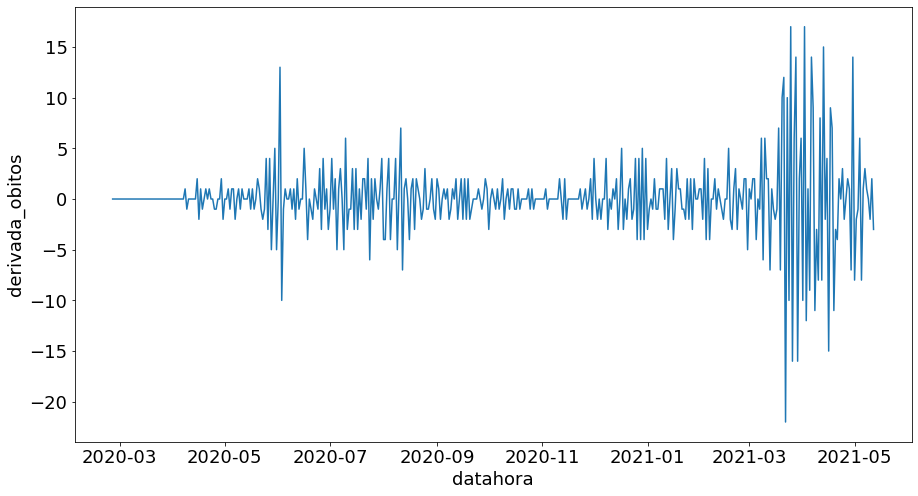

In [ ]:
sns.lineplot(x='datahora', y='derivada_obitos', data=dados_jund)

### Desafio 2: Ver se os picos das derivadas de óbitos coincide com a derivada dos casos:

Nos gráficos de SP vemos que não e nos de Jundiaí observamos um padrão um pouco diferente em relação à derivada da taxa de óbitos novos, contudo, os picos ainda não batem com a derivada da taxa de novos casos.

Como num gráfico de linha ele liga os pontos, podemos ter a impressão de estar ocorrendo uma variação que na realidade não está acontecendo, assim, faremos um gráfico de barras para melhor visualizar.

<BarContainer object of 443 artists>

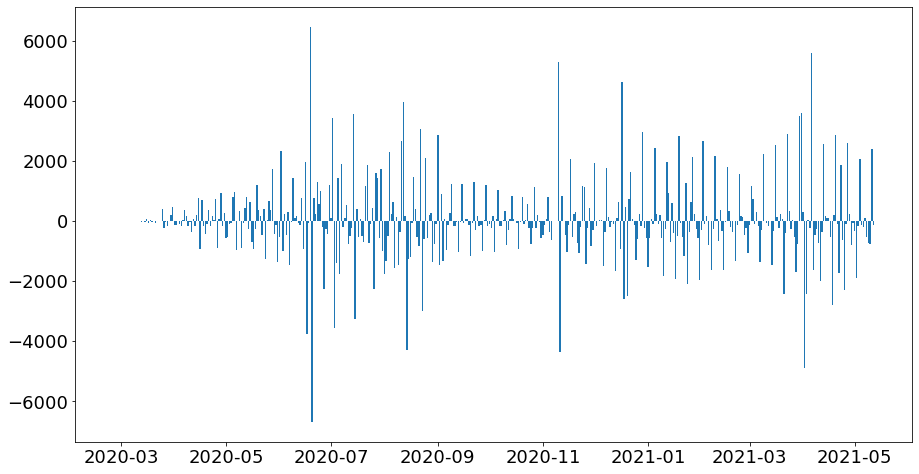

In [ ]:
plt.bar(dados_sp['datahora'], dados_sp['derivada_casos'])

<BarContainer object of 443 artists>

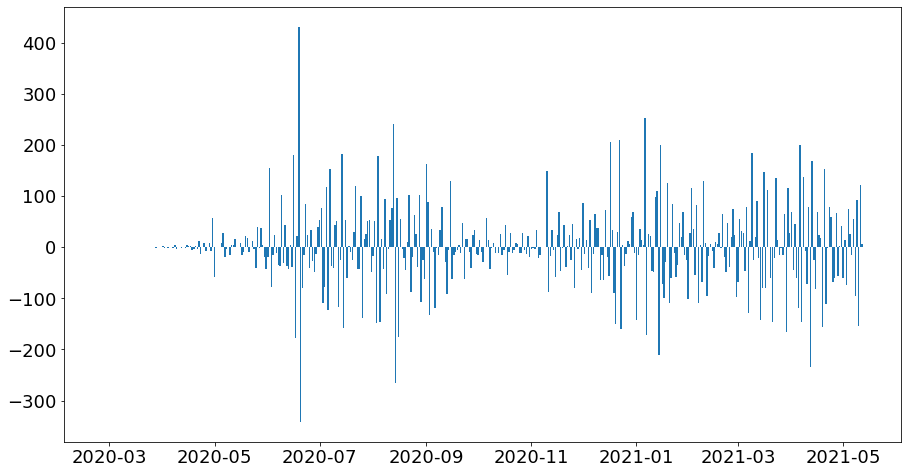

In [ ]:
plt.bar(dados_jund['datahora'], dados_jund['derivada_casos'])

In [ ]:
dados_sp.loc[:,'ano'] = pd.DatetimeIndex(dados_sp.loc[:,'datahora']).year
dados_jund.loc[:,'ano'] = pd.DatetimeIndex(dados_jund.loc[:,'datahora']).year

/home/lulu/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/home/lulu/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1745: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [ ]:
dados_2021_sp = dados_sp.query('ano == 2021')
dados_2021_jund = dados_jund.query('ano == 2021')

<BarContainer object of 132 artists>

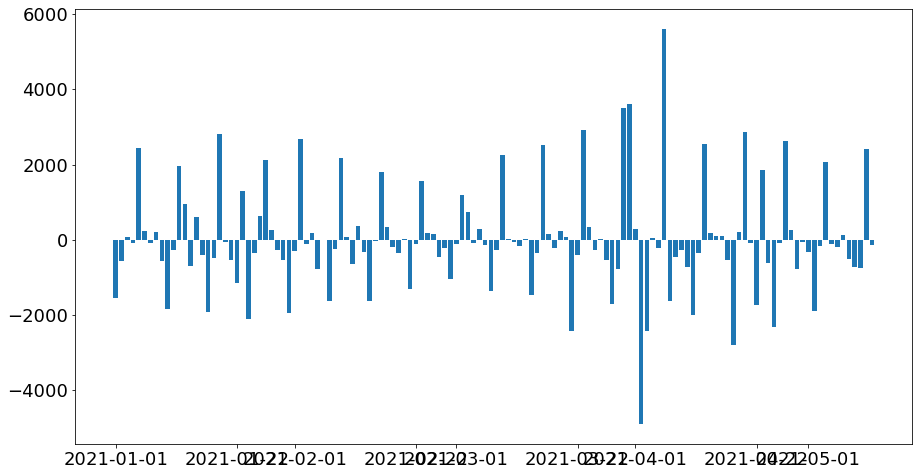

In [ ]:
plt.bar(dados_2021_sp['datahora'], dados_2021_sp['derivada_casos'])

<BarContainer object of 132 artists>

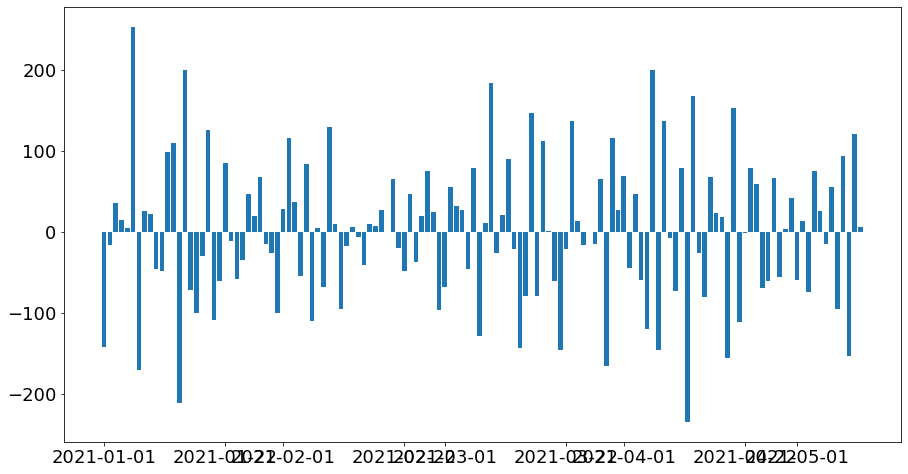

In [ ]:
plt.bar(dados_2021_jund['datahora'], dados_2021_jund['derivada_casos'])

### Desafio 3 : Melhorar os gráficos.

In [ ]:
dados_sp.loc[:,'media_movel_casos'] = dados_sp.loc[:,'casos_novos'].rolling(window=7, center=False).mean()
dados_sp.loc[:,'media_movel_obitos'] = dados_sp.loc[:,'obitos_novos'].rolling(window=7, center=False).mean()
dados_jund.loc[:,'media_movel_casos'] = dados_jund.loc[:,'casos_novos'].rolling(window=7, center=False).mean()
dados_jund.loc[:,'media_movel_obitos'] = dados_jund.loc[:,'obitos_novos'].rolling(window=7, center=False).mean()

<AxesSubplot:xlabel='datahora', ylabel='casos_novos'>

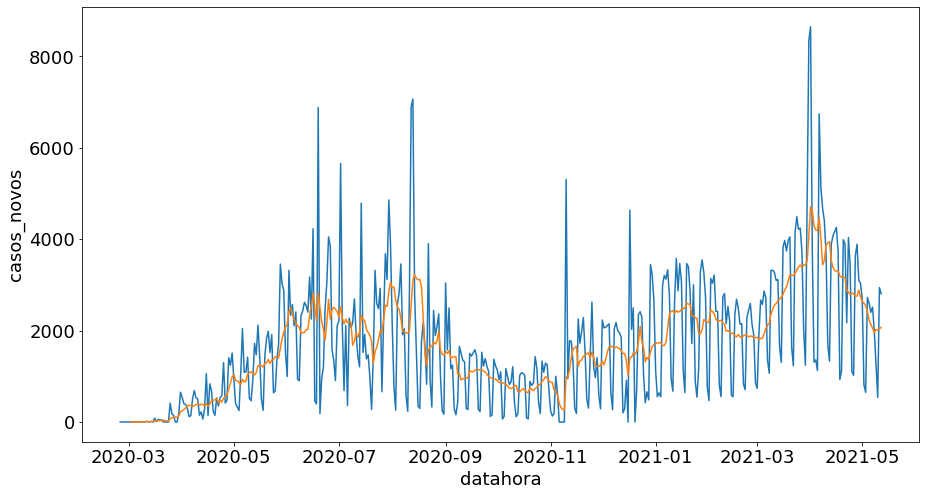

In [ ]:
sns.lineplot(x='datahora', y='casos_novos', data=dados_sp)
sns.lineplot(x='datahora', y='media_movel_casos', data=dados_sp)


A média móvel suaviza efeitos de sazonalidade: nós estamos lidando com dados reportados, então, os dados de um dia podem ser só notificados 5 dias depois, criando picos, logo, usando a média móvel podemos retirar um pouco desses efeitos de picos e ter uma melhor análise.

### Desafio 4 : Gráfico média móvel de óbitos. Mudar os gráficos de casos de linha para barra.

In [ ]:
dados_sp.loc[:,'mes'] = pd.DatetimeIndex(dados_sp.loc[:,'datahora']).month
dados_jund.loc[:,'mes'] = pd.DatetimeIndex(dados_jund.loc[:,'datahora']).month
dados_sp.loc[:,'datahora'] = dados_sp.loc[:,'datahora'].astype('datetime64')
dados_jund.loc[:,'datahora'] = dados_jund.loc[:,'datahora'].astype('datetime64')

/home/lulu/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1745: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


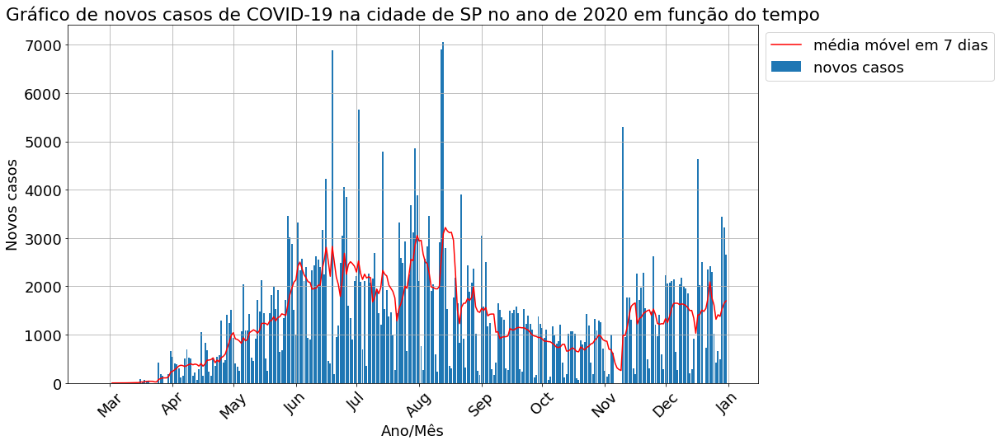

In [ ]:
plt.bar(dados_sp.query('ano == 2020')['datahora'],dados_sp.query('ano == 2020')['casos_novos'],
       label='novos casos')
ax = sns.lineplot(x='datahora', y='media_movel_casos', data=dados_sp.query('ano == 2020'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos casos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos casos de COVID-19 na cidade de SP no ano de 2020 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xticks(rotation=45)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.grid()
plt.show()

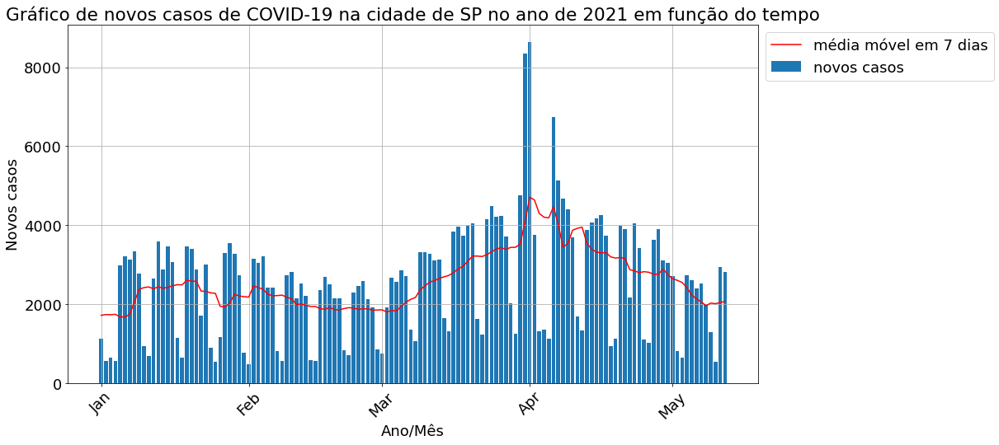

In [ ]:
plt.bar(dados_sp.query('ano == 2021')['datahora'],dados_sp.query('ano == 2021')['casos_novos'],
       label='novos casos')
ax = sns.lineplot(x='datahora', y='media_movel_casos', data=dados_sp.query('ano == 2021'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos casos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos casos de COVID-19 na cidade de SP no ano de 2021 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.xticks(rotation=45)
plt.grid()
plt.show()

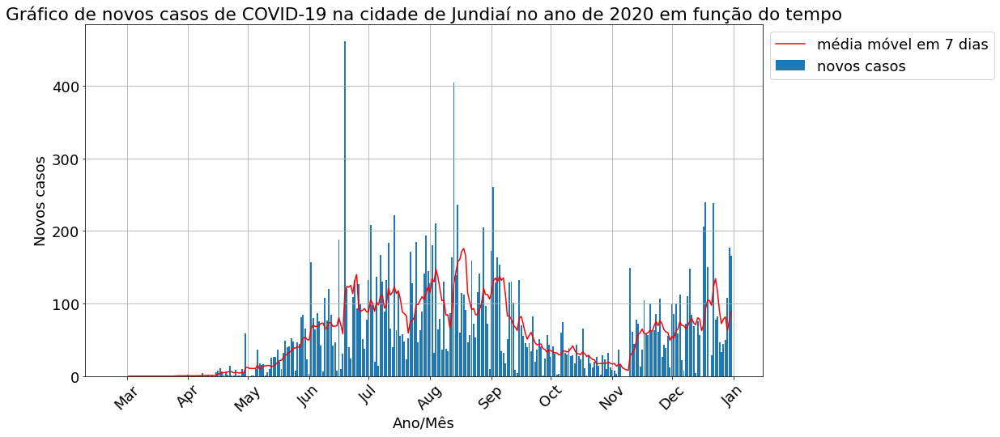

In [ ]:
plt.bar(dados_jund.query('ano == 2020')['datahora'],dados_jund.query('ano == 2020')['casos_novos'],
       label='novos casos')
ax = sns.lineplot(x='datahora', y='media_movel_casos', data=dados_jund.query('ano == 2020'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos casos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos casos de COVID-19 na cidade de Jundiaí no ano de 2020 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xticks(rotation=45)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.grid()
plt.show()

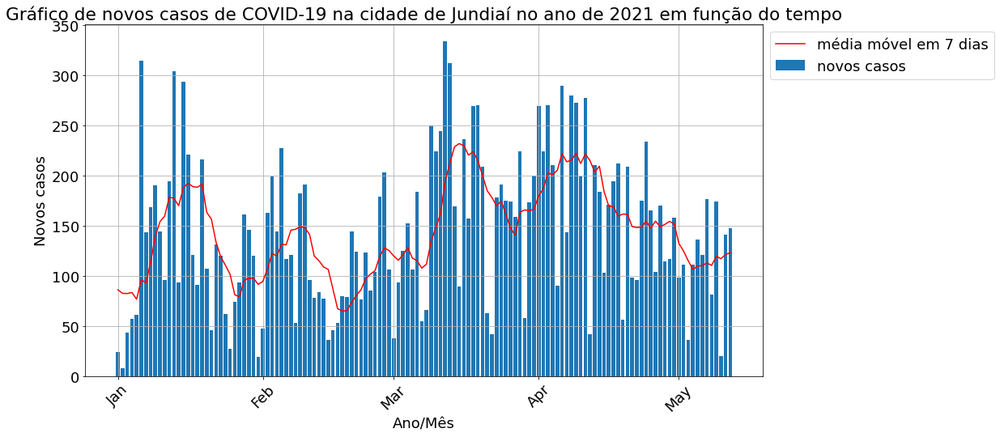

In [ ]:
plt.bar(dados_jund.query('ano == 2021')['datahora'],dados_jund.query('ano == 2021')['casos_novos'],
       label='novos casos')
ax = sns.lineplot(x='datahora', y='media_movel_casos', data=dados_jund.query('ano == 2021'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos casos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos casos de COVID-19 na cidade de Jundiaí no ano de 2021 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.xticks(rotation=45)
plt.grid()
plt.show()

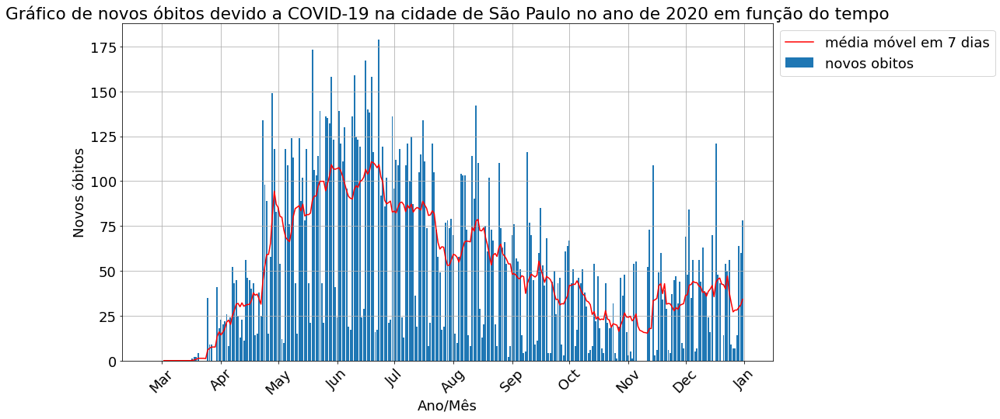

In [ ]:
plt.bar(dados_sp.query('ano == 2020')['datahora'],dados_sp.query('ano == 2020')['obitos_novos'],
       label='novos obitos')
ax = sns.lineplot(x='datahora', y='media_movel_obitos', data=dados_sp.query('ano == 2020'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos óbitos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos óbitos devido a COVID-19 na cidade de São Paulo no ano de 2020 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xticks(rotation=45)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.grid()
plt.show()

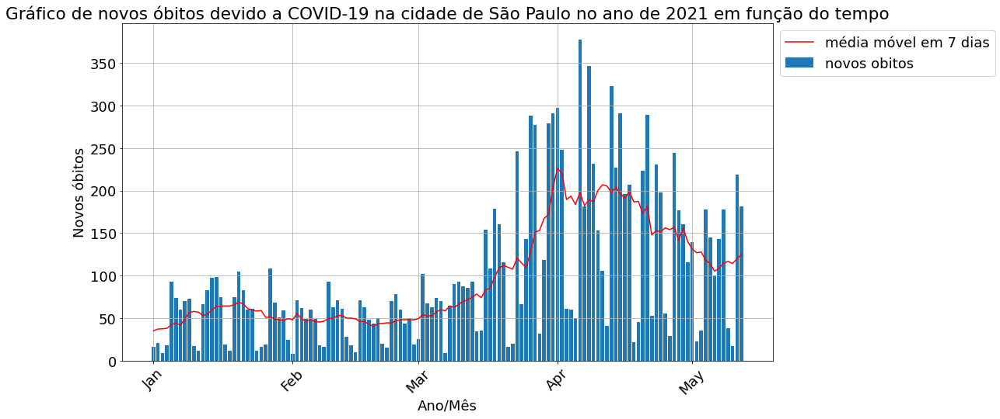

In [ ]:
plt.bar(dados_sp.query('ano == 2021')['datahora'],dados_sp.query('ano == 2021')['obitos_novos'],
       label='novos obitos')
ax = sns.lineplot(x='datahora', y='media_movel_obitos', data=dados_sp.query('ano == 2021'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos óbitos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos óbitos devido a COVID-19 na cidade de São Paulo no ano de 2021 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xticks(rotation=45)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.grid()
plt.show()

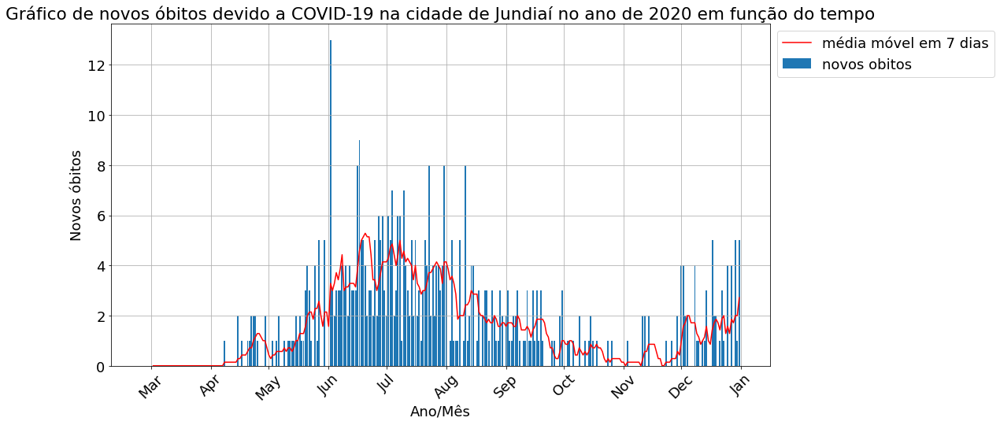

In [ ]:
plt.bar(dados_jund.query('ano == 2020')['datahora'],dados_jund.query('ano == 2020')['obitos_novos'],
       label='novos obitos')
ax = sns.lineplot(x='datahora', y='media_movel_obitos', data=dados_jund.query('ano == 2020'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos óbitos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos óbitos devido a COVID-19 na cidade de Jundiaí no ano de 2020 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xticks(rotation=45)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.grid()
plt.show()

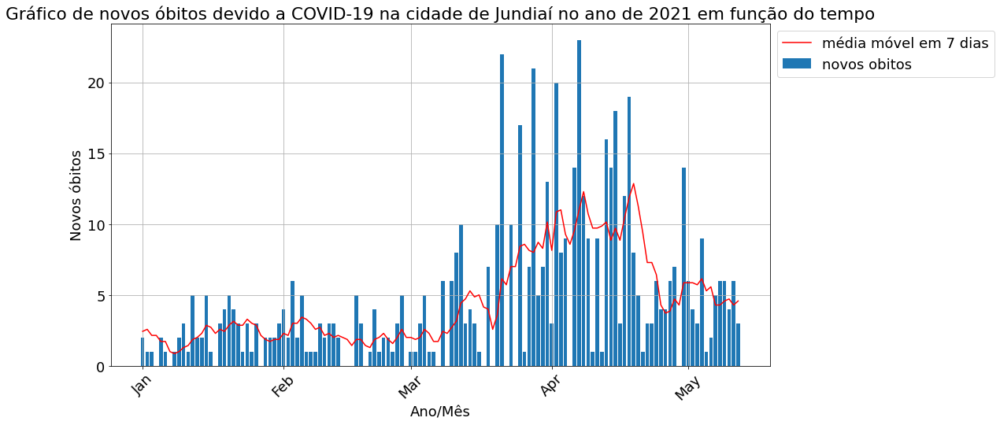

In [ ]:
plt.bar(dados_jund.query('ano == 2021')['datahora'],dados_jund.query('ano == 2021')['obitos_novos'],
       label='novos obitos')
ax = sns.lineplot(x='datahora', y='media_movel_obitos', data=dados_jund.query('ano == 2021'), color='red',
                 label='média móvel em 7 dias')
plt.ylabel('Novos óbitos')
plt.xlabel('Ano/Mês')
plt.title('Gráfico de novos óbitos devido a COVID-19 na cidade de Jundiaí no ano de 2021 em função do tempo')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xticks(rotation=45)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.grid()
plt.show()

Aqui eu dividi os gráficos de óbitos nos anos de 2020 e 2021 para melhor visualização e plotei para as cidades de são paulo e jundiaí.

<AxesSubplot:xlabel='casos_novos', ylabel='casos_novos'>

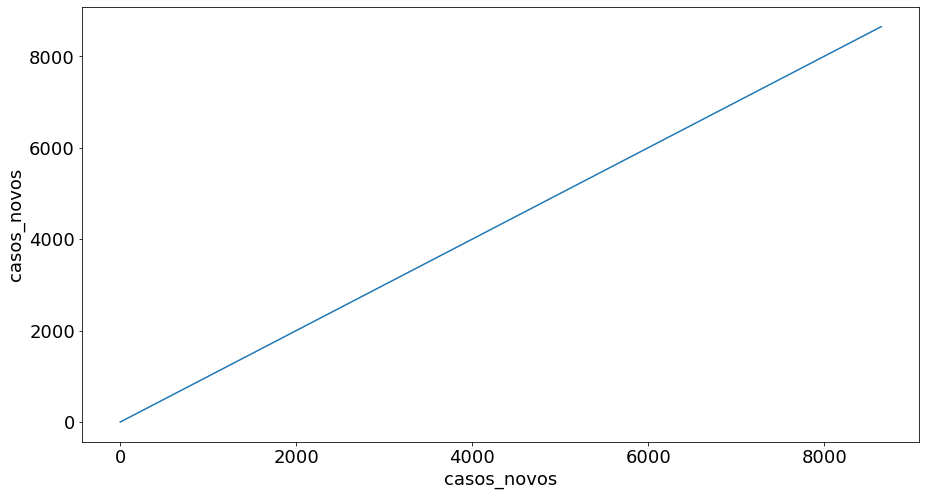

In [ ]:
sns.lineplot(x='casos_novos',y='casos_novos',data=dados_sp)

<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

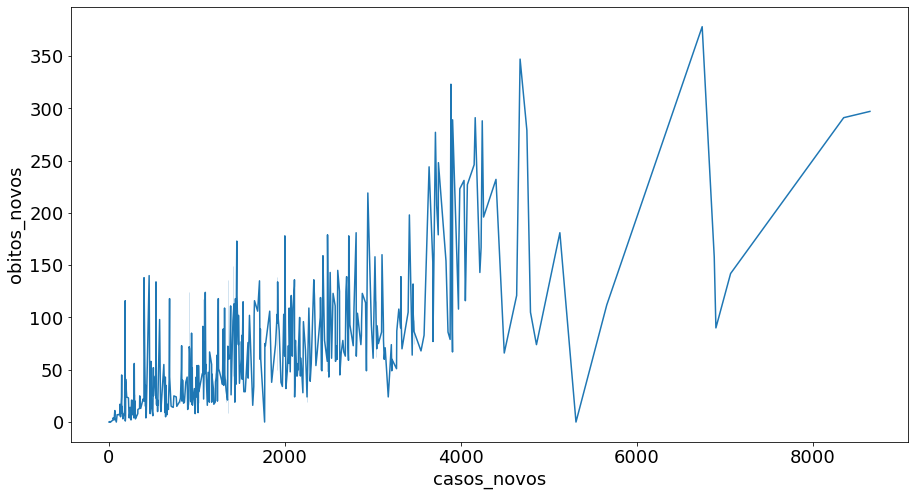

In [ ]:
sns.lineplot(x=dados_sp.loc[:,'casos_novos'],y=dados_sp.loc[:,'obitos_novos'], data=dados_sp)

### Desafio 5: Mover o número de óbitos alguns dias e verificar o gráfico de correlação.

In [ ]:
col1 = dados_sp[7:]['obitos_novos'].reset_index()['obitos_novos']
col2 = dados_sp[:-7]['casos_novos'].reset_index()['casos_novos']
col3 = dados_sp[:-7]['datahora'].reset_index()['datahora']
obitos_movidos = pd.DataFrame({'obitos_novos':col1, 'casos_novos':col2, 'datahora':col3})
obitos_movidos

,obitos_novos,casos_novos,datahora
0,0,0,2020-02-25
1,0,0,2020-02-26
2,0,0,2020-02-27
3,0,1,2020-02-28
4,0,0,2020-02-29
...,...,...,...
431,178,2700,2021-05-01
432,38,812,2021-05-02
433,17,650,2021-05-03
434,219,2724,2021-05-04


<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

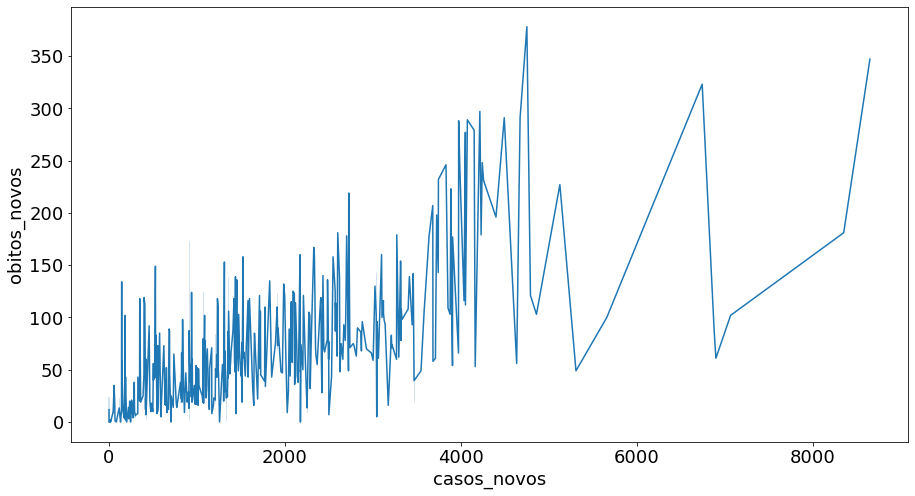

In [ ]:
sns.lineplot(x=obitos_movidos.loc[:,'casos_novos'],y=obitos_movidos.loc[:,'obitos_novos'], data=obitos_movidos)


<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

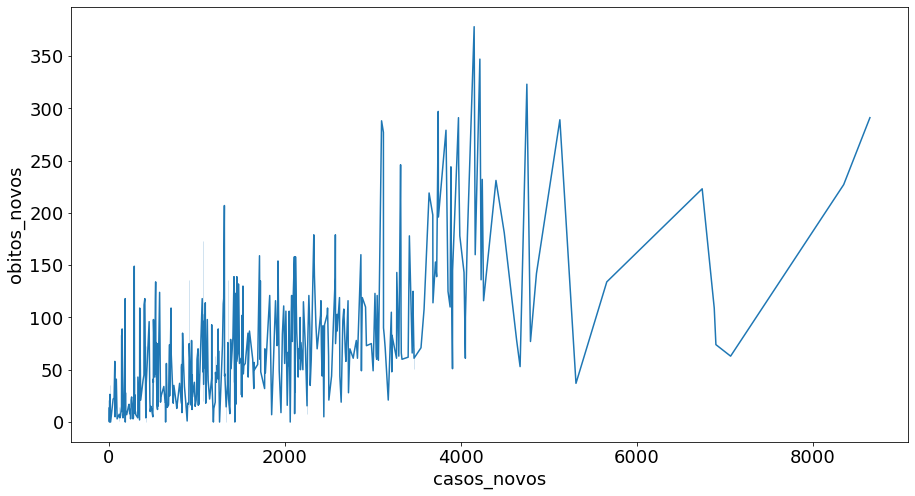

In [ ]:
col1 = dados_sp[14:]['obitos_novos'].reset_index()['obitos_novos']
col2 = dados_sp[:-14]['casos_novos'].reset_index()['casos_novos']
col3 = dados_sp[:-14]['datahora'].reset_index()['datahora']
obitos_movidos2 = pd.DataFrame({'obitos_novos':col1, 'casos_novos':col2, 'datahora':col3})
sns.lineplot(x=obitos_movidos2.loc[:,'casos_novos'],y=obitos_movidos2.loc[:,'obitos_novos'], data=obitos_movidos2)


Movendo os óbitos 1 semana e 2 semanas adiante não mudou em quase nada o padrão de correlação entre as duas variáveis.

<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

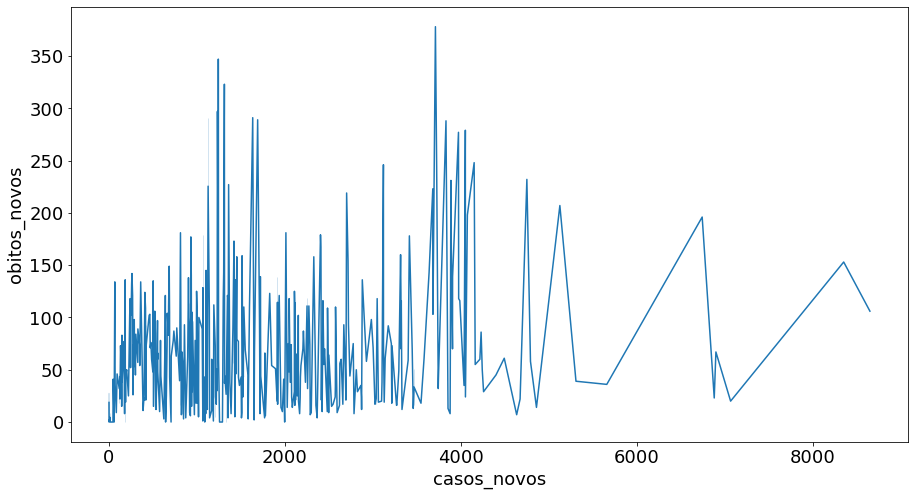

In [ ]:
col1 = dados_sp[10:]['obitos_novos'].reset_index()['obitos_novos']
col2 = dados_sp[:-10]['casos_novos'].reset_index()['casos_novos']
col3 = dados_sp[:-10]['datahora'].reset_index()['datahora']
obitos_movidos3 = pd.DataFrame({'obitos_novos':col1, 'casos_novos':col2, 'datahora':col3})
sns.lineplot(x=obitos_movidos3.loc[:,'casos_novos'],y=obitos_movidos3.loc[:,'obitos_novos'], data=obitos_movidos3)


<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

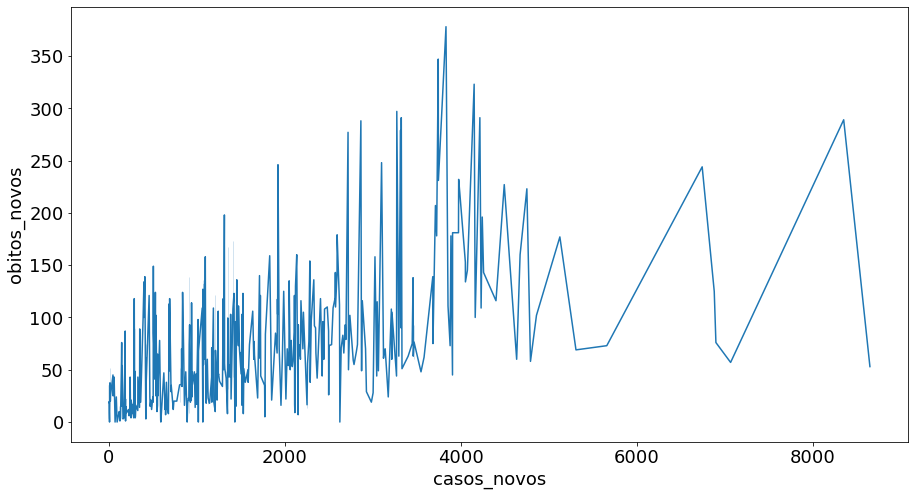

In [ ]:
col1 = dados_sp[21:]['obitos_novos'].reset_index()['obitos_novos']
col2 = dados_sp[:-21]['casos_novos'].reset_index()['casos_novos']
col3 = dados_sp[:-21]['datahora'].reset_index()['datahora']
obitos_movidos4 = pd.DataFrame({'obitos_novos':col1, 'casos_novos':col2, 'datahora':col3})
sns.lineplot(x=obitos_movidos4.loc[:,'casos_novos'],y=obitos_movidos4.loc[:,'obitos_novos'], data=obitos_movidos4)


<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

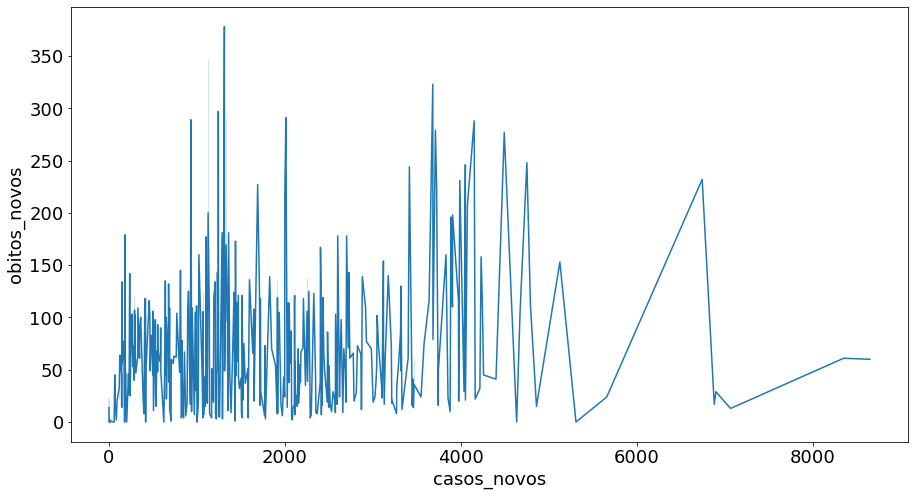

In [ ]:
col1 = dados_sp[3:]['obitos_novos'].reset_index()['obitos_novos']
col2 = dados_sp[:-3]['casos_novos'].reset_index()['casos_novos']
col3 = dados_sp[:-3]['datahora'].reset_index()['datahora']
obitos_movidos5 = pd.DataFrame({'obitos_novos':col1, 'casos_novos':col2, 'datahora':col3})
sns.lineplot(x=obitos_movidos5.loc[:,'casos_novos'],y=obitos_movidos5.loc[:,'obitos_novos'], data=obitos_movidos5)


<AxesSubplot:xlabel='casos_novos', ylabel='obitos_novos'>

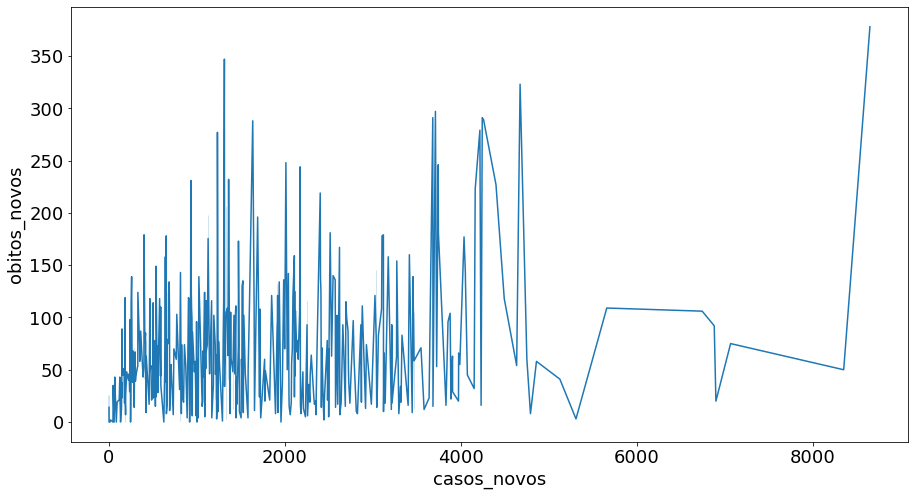

In [ ]:
col1 = dados_sp[5:]['obitos_novos'].reset_index()['obitos_novos']
col2 = dados_sp[:-5]['casos_novos'].reset_index()['casos_novos']
col3 = dados_sp[:-5]['datahora'].reset_index()['datahora']
obitos_movidos6 = pd.DataFrame({'obitos_novos':col1, 'casos_novos':col2, 'datahora':col3})
sns.lineplot(x=obitos_movidos6.loc[:,'casos_novos'],y=obitos_movidos6.loc[:,'obitos_novos'], data=obitos_movidos6)


Testando para 3, 5 e 21 dias de deslocamento na coluna de óbito parece que o padrão pouco muda, mudando somente a inclinação do padrão.

In [ ]:
dados_202101 = dados_sp.query('mes == 1 & ano == 2021')
dados_202102 = dados_sp.query('mes == 2 & ano == 2021')

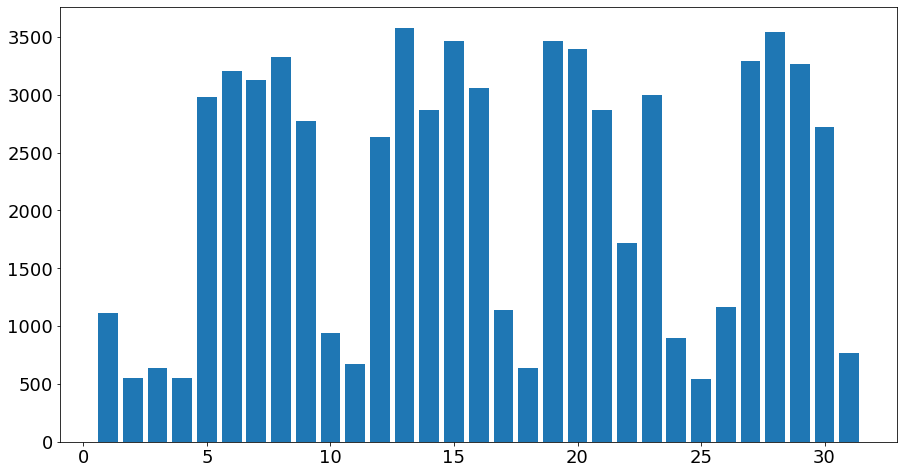

<BarContainer object of 28 artists>

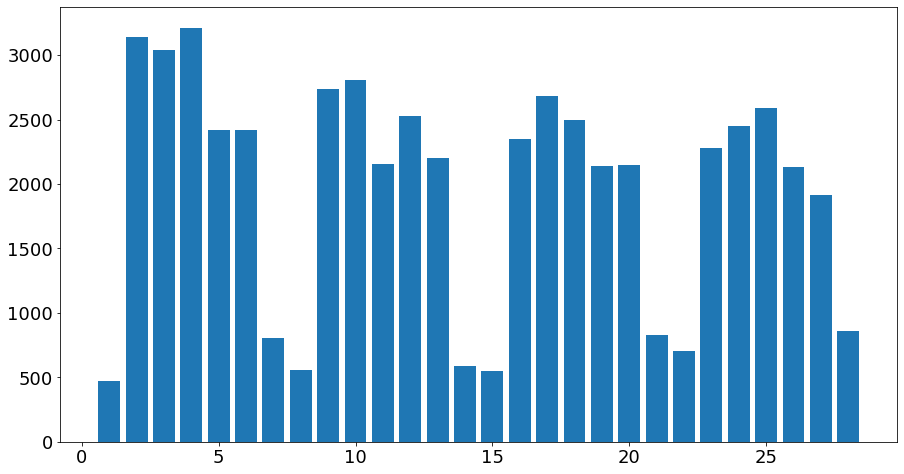

In [ ]:
plt.bar(np.linspace(1,31,31), dados_202101['casos_novos'])
plt.show()
plt.bar(np.linspace(1,28,28), dados_202102['casos_novos'])

Podemos ver que há um padrão de sazonalidade: há 5 dias com uma notificação de casos bem alto e em seguida 2 dias com uma notificação bem baixa. Podemos levantar a hipótese de que esses 2 dias sejam os finais de semana e que também , por 25 de janeiro ter essa baixa, que essas baixas ocorrem em feriados. Nem sempre é tal fácil enxergar um padrão de sazionalidade como fizemos, assim, temos uma função do pandas pra tentar encontrar uma função de autocorrelação.

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

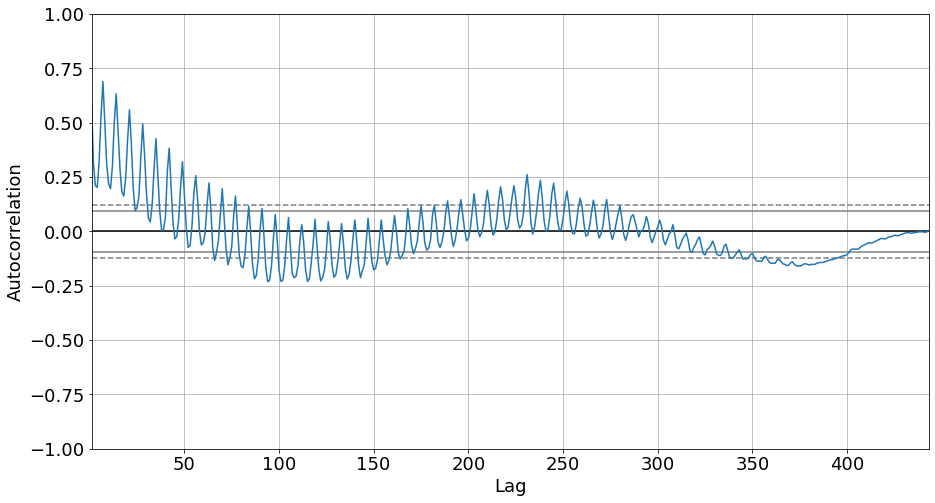

In [ ]:
autocorrelation_plot(dados_sp['casos_novos'])

Gráf em lags. Para construir esse gráfico nós pegamos a série temporal de casos novos e botamos uma cópia dela logo embaixo, é a copia dela pq é uma auto-correlação, multiplicando cada um dos termos pelo seu respectivo dia e depois soma os valores, assim, é calculado o valor do primeiro lag, em seguida movemos a série de baixo e multiplicamos os termos com um dia de delay, contruindo assim o segundo lag, então vamos movendo a série e fazendo essas multiplicações e somas para constuir cada um dos lags. 

Quando temos uma correlação perfeita, ou seja, o gráfico está totalmente embaixo da cópia dele temos um valor bem alto de autocorrelação, então, conforme fossemos movendo e se os valores fossem aleatórios na série temporal a autocorrelação tenderia à zero. Como temos uma sazionalidade enxergaremos pequenas cópias e nesse caso específico continuaremos enxergando valores altos no gráfico de auto-correlação.

Vamos verifcar esse gráfico para uma série totalmente aleatória.

In [ ]:
dados_sp.shape

(443, 31)

In [ ]:
aleatorio = np.random.rand(433)

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

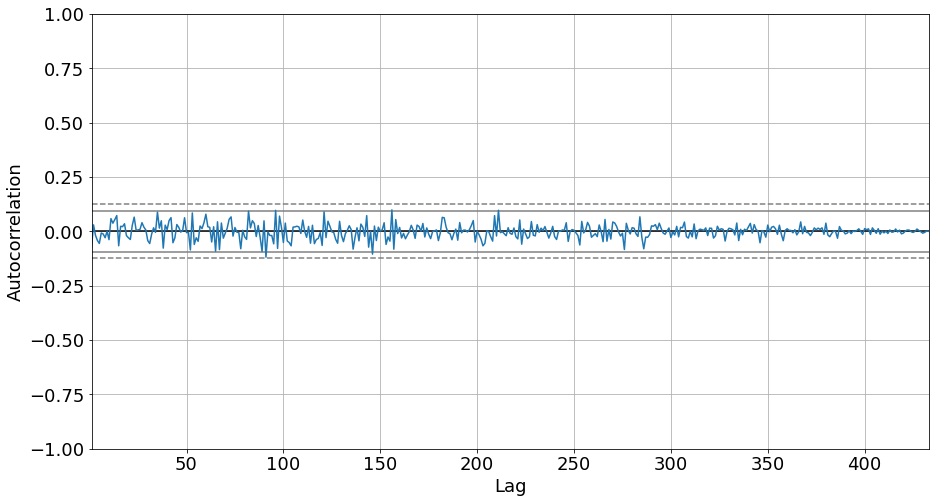

In [ ]:
autocorrelation_plot(aleatorio)

Vemos então que todos os valores estão muito próximos de 0 oq indica que não há uma sazonalidade.

Voltando ao gráfico anterior, interpretamos que o ponto atual da pandemia não é mais comparável, temporalmente, ao ponto do início da pandemia.

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

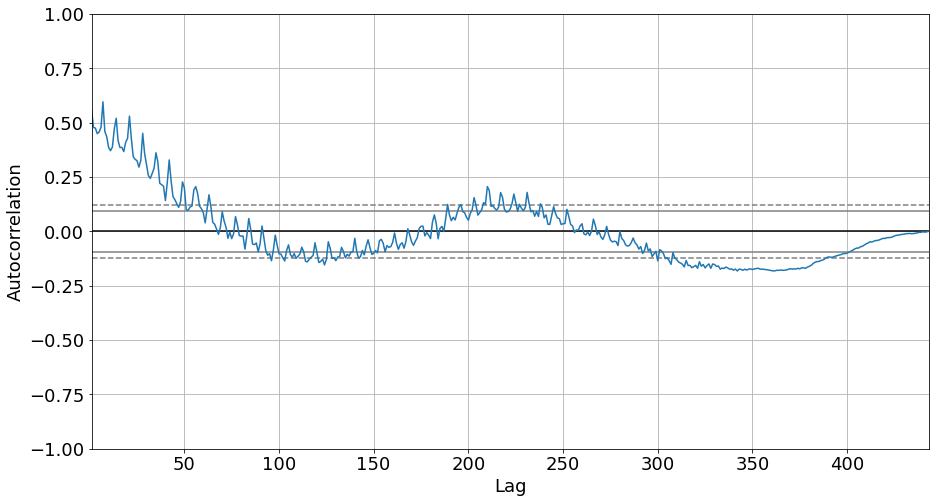

In [ ]:
autocorrelation_plot(dados_jund['casos_novos'])

### Desafio 6: Calcular a correlação cruzada do número de óbitos com o  número de casos. biblioteca statsmodels.

### Desafio 7: Estudar outro município : já estou fazendo.

In [ ]:
md = smf.mixedlm("casos_novos ~ obitos_novos", dados_sp, groups=dados_sp["nome_munic"])
mdf = md.fit(method=["lbfgs"])
print(mdf.summary())

             Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   casos_novos
No. Observations:    443       Method:               REML       
No. Groups:          1         Scale:                936715.7772
Min. group size:     443       Log-Likelihood:       -3667.9048 
Max. group size:     443       Converged:            Yes        
Mean group size:     443.0                                      
----------------------------------------------------------------
               Coef.    Std.Err.   z    P>|z|   [0.025   0.975] 
----------------------------------------------------------------
Intercept       608.131  970.065  0.627 0.531 -1293.161 2509.423
obitos_novos     16.452    0.722 22.799 0.000    15.038   17.866
Group Var    936715.777                                         



/home/lulu/anaconda3/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2189: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


/home/lulu/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:2551: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/lulu/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


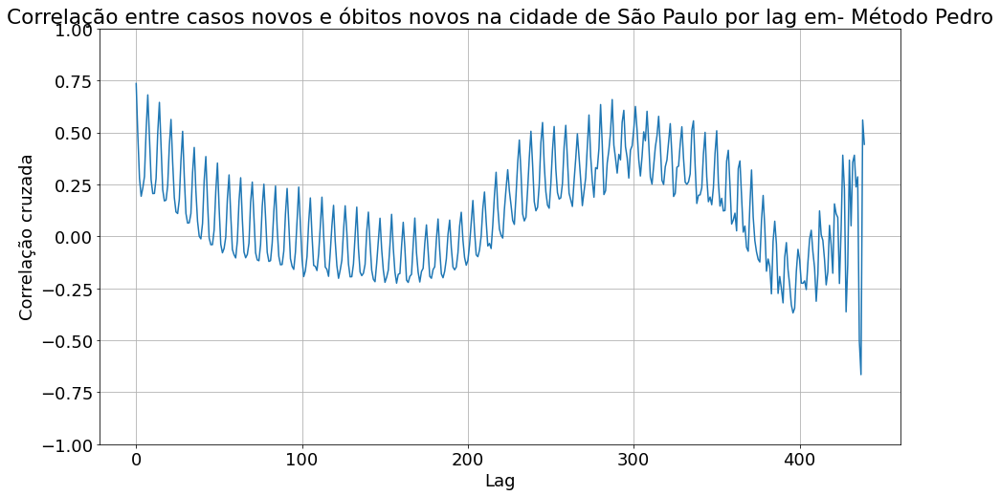

In [ ]:
def crosscorr(datax, datay, lag=0):
    return datax.corr(datay.shift(-lag))

y_corr = [crosscorr(dados_sp['casos_novos'], dados_sp['obitos_novos'], lag) for lag in range(0,len(dados_sp))]
x_lag = range(0,len(dados_sp))
plt.plot(x_lag, y_corr)
plt.ylim(-1,1)
plt.title('Correlação entre casos novos e óbitos novos na cidade de São Paulo por lag em- Método Pedro')
plt.xlabel('Lag')
plt.ylabel('Correlação cruzada')
plt.grid()
plt.show()

In [ ]:
ccf_out = smt.ccf(dados_sp.loc[:,"casos_novos"], dados_sp.loc[:,"obitos_novos"], unbiased = False)

<ipython-input-62-7d3d891c42aa>:1: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead
  ccf_out = smt.ccf(dados_sp.loc[:,"casos_novos"], dados_sp.loc[:,"obitos_novos"], unbiased = False)


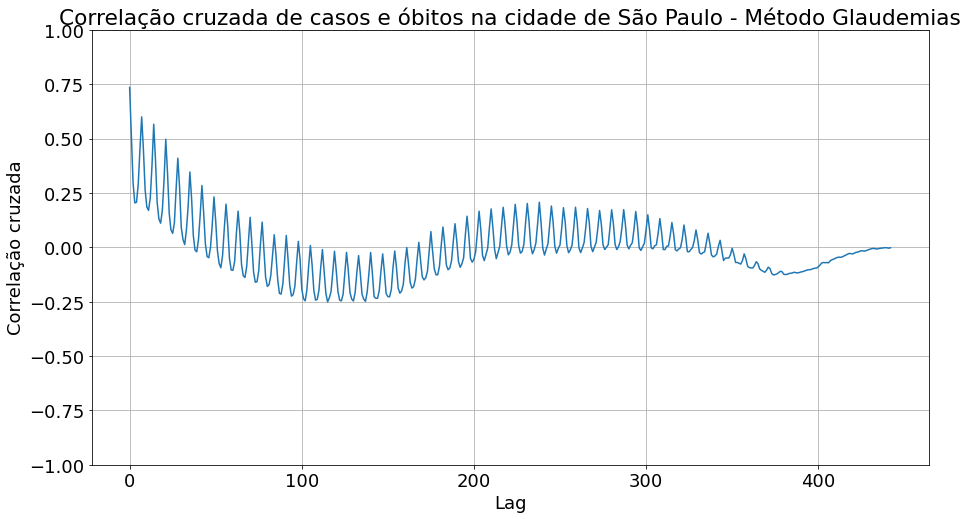

In [ ]:
plt.title("Correlação cruzada de casos e óbitos na cidade de São Paulo - Método Glaudemias")
plt.plot(x_lag, ccf_out)
plt.ylim(-1,1)
plt.ylabel("Correlação cruzada")
plt.xlabel("Lag")
plt.grid()
plt.show()

/home/lulu/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:2551: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/lulu/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


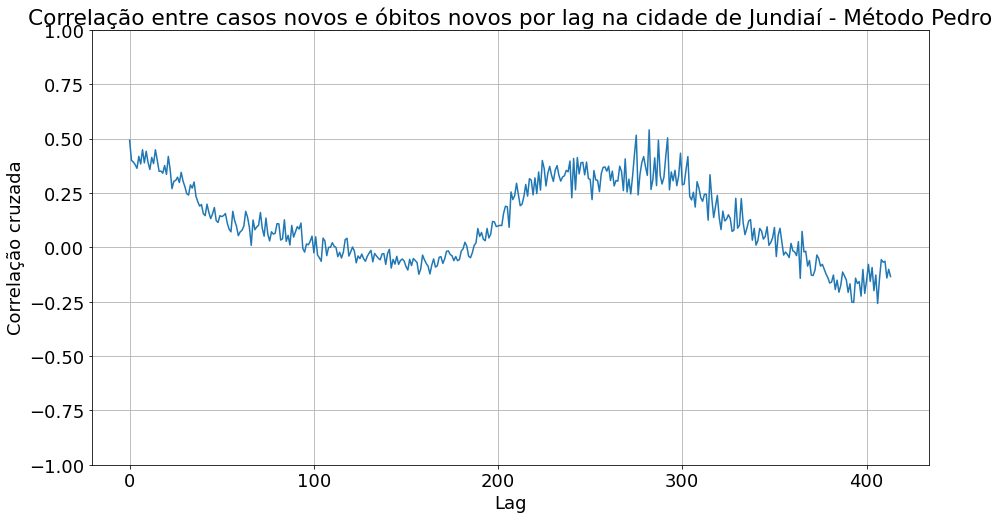

In [ ]:
y_corr = [crosscorr(dados_jund['casos_novos'], dados_jund['obitos_novos'], lag) for lag in range(0,len(dados_jund))]
x_lag = range(0,len(dados_jund))
plt.plot(x_lag, y_corr)
plt.ylim(-1,1)
plt.title('Correlação entre casos novos e óbitos novos por lag na cidade de Jundiaí - Método Pedro')
plt.xlabel('Lag')
plt.ylabel('Correlação cruzada')
plt.grid()
plt.show()

<ipython-input-65-fc780704573f>:1: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead
  ccf_out2 = smt.ccf(dados_jund.loc[:,"casos_novos"], dados_jund.loc[:,"obitos_novos"], unbiased = False)


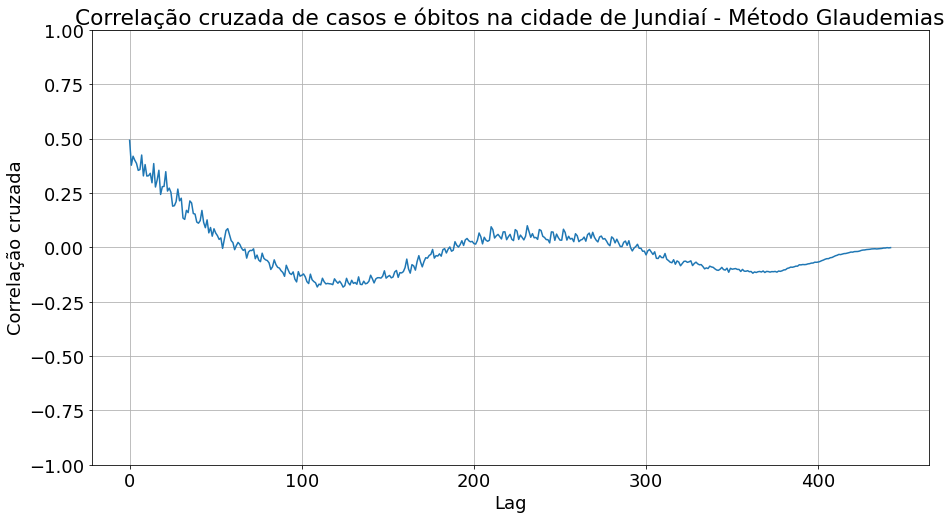

In [ ]:
ccf_out2 = smt.ccf(dados_jund.loc[:,"casos_novos"], dados_jund.loc[:,"obitos_novos"], unbiased = False)
plt.title("Correlação cruzada de casos e óbitos na cidade de Jundiaí - Método Glaudemias")
plt.plot(x_lag, ccf_out2)
plt.ylim(-1,1)
plt.ylabel("Correlação cruzada")
plt.xlabel("Lag")
plt.grid()
plt.show()

Agora iremos usar o facebook proofit, que é uma ferramenta criada pelo Facebook em 2017 para fazer previsão de dados temporais. Para isso temos que fazer o dataframe ficar da forma que o fproofit aceita e iremos ver isso a seguir.

In [ ]:
df = pd.DataFrame()

In [ ]:
df['ds'] = dados_sp['datahora'][:400]

In [ ]:
df['y'] = dados_sp['casos_novos'][:400]

In [ ]:
dados_sp.shape

(443, 31)

In [ ]:
modelo = Prophet()

Prophet é um algoritmo de machine learning, assim, ele irá achar a função que melhor descreve o gráfico dos casos de covid e irá extender essa função para o domínio de datas futuras

In [ ]:
modelo.fit(df)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
dataframefuturo = modelo.make_future_dataframe(periods=43)

In [ ]:
dataframefuturo.head()

,ds
0,2020-02-25
1,2020-02-26
2,2020-02-27
3,2020-02-28
4,2020-02-29


In [ ]:
previsao = modelo.predict(dataframefuturo)
previsao.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-02-25,-122.523348,-729.144843,1299.069570,-122.523348,-122.523348,457.824298,457.824298,457.824298,457.824298,457.824298,457.824298,0.0,0.0,0.0,335.300950
1,2020-02-26,-104.913020,-718.229957,1427.755420,-104.913020,-104.913020,456.403784,456.403784,456.403784,456.403784,456.403784,456.403784,0.0,0.0,0.0,351.490764
2,2020-02-27,-87.302691,-577.635939,1568.088541,-87.302691,-87.302691,595.693301,595.693301,595.693301,595.693301,595.693301,595.693301,0.0,0.0,0.0,508.390609
3,2020-02-28,-69.692363,-756.758328,1380.277077,-69.692363,-69.692363,340.583780,340.583780,340.583780,340.583780,340.583780,340.583780,0.0,0.0,0.0,270.891417
4,2020-02-29,-52.082035,-1035.076702,1064.482699,-52.082035,-52.082035,59.118192,59.118192,59.118192,59.118192,59.118192,59.118192,0.0,0.0,0.0,7.036157


In [ ]:
df_teste = pd.DataFrame()
df_teste['ds'] = dados_sp['datahora'][400:]
df_teste['y'] = dados_sp['casos_novos'][400:]

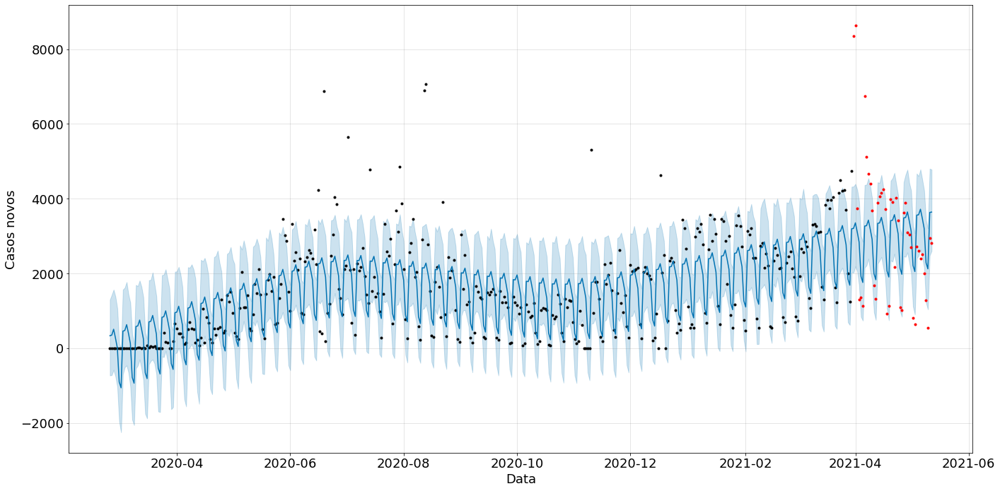

In [ ]:
modelo.plot(previsao, xlabel='Data', ylabel='Casos novos', figsize=(20,10));
plt.plot(df_teste['ds'],df_teste['y'],'.r')

O modelo de previsão ignora alguns pontos discrepantes para não ocorrer o problema de overfitting, que seria a construção de um modelo que descreve muito bem os dados passados mas faz previsões muito pobres.

Vamos agora dividir os dados em dados de treino e dados de teste para ter como ver se nosso modelo está fazendo boas previsões. Pegaremos os primeiros 400 dias para construir o modelo.

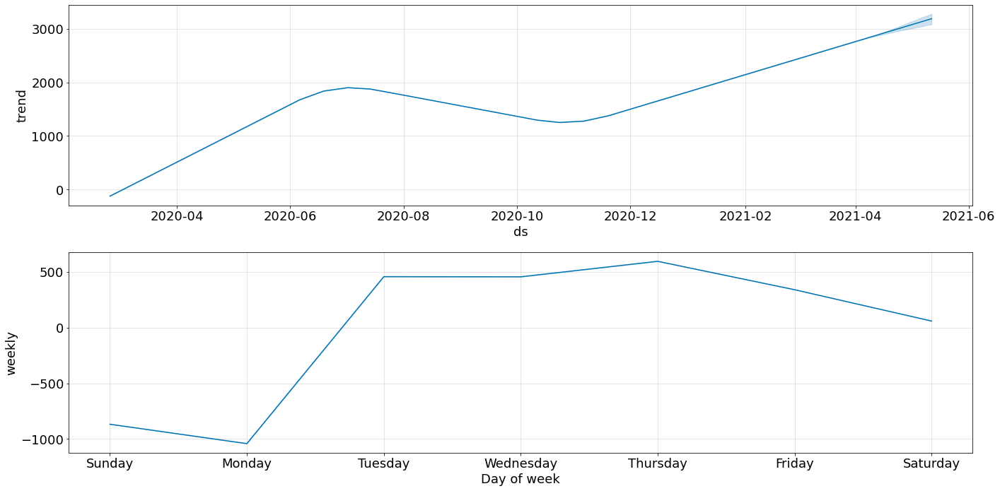

In [ ]:
modelo.plot_components(previsao,figsize=(20,10));

O primeiro gráfico fala sobre a tendência geral nos dados, que conseguimos enxergar olhando somente para o gráfico do modelo. 

O segundo gráfico mostra que o algoritmo identificou uma sazonalidade semanal!

A decomposição da série temporal é super importante, assim, indicando 2 padrões na série que estamos tratando que são expostos por esses 2 gráficos.

### Desafio 1 -  2 - 3: Mudar os períodos de previsão.

### Desafio 2 - 2 - 3: Olhar a documentação do prophet.

### Desafio 3 - 2 - 3: Melhorar os gráficos.

In [ ]:
#Desafio 1 - 2 - 3:

def future(nmr: int):
    df2 = pd.DataFrame()
    df2['ds'] = dados_sp['datahora'][:(443 - nmr)]
    df2['y'] = dados_sp['casos_novos'][:(443 - nmr)]
    modelo2 = Prophet()
    modelo2.fit(df2)
    dataframefuturo2 = modelo2.make_future_dataframe(periods=nmr)
    previsao2 = modelo2.predict(dataframefuturo2)
    df_teste2 = pd.DataFrame()
    df_teste2['ds'] = dados_sp['datahora'][(443 - nmr):]
    df_teste2['y'] = dados_sp['casos_novos'][(443 - nmr):]
    modelo2.plot(previsao2, xlabel='Data', ylabel='Casos novos', figsize=(20,10));
    plt.plot(df_teste2['ds'],df_teste2['y'],'.r')


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


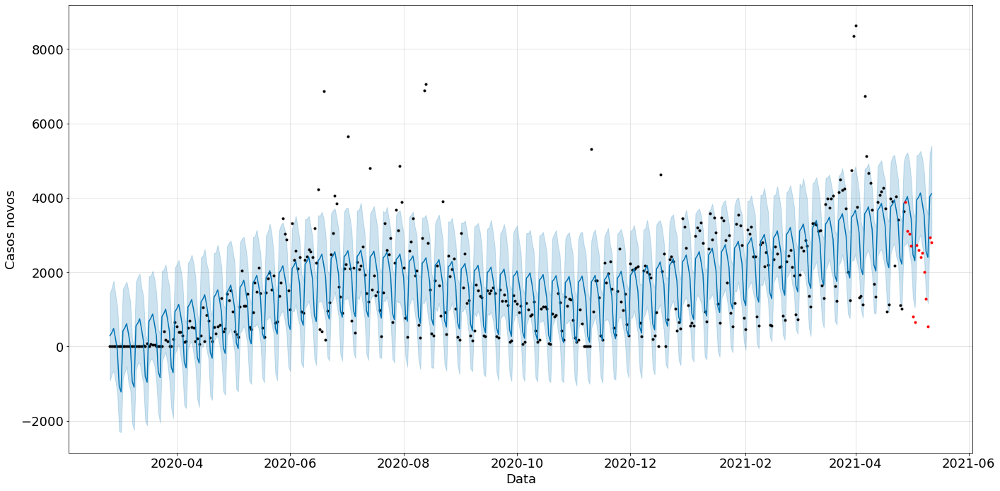

In [ ]:
#prevendo os últimos 15 dias dos dados:

future(15)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


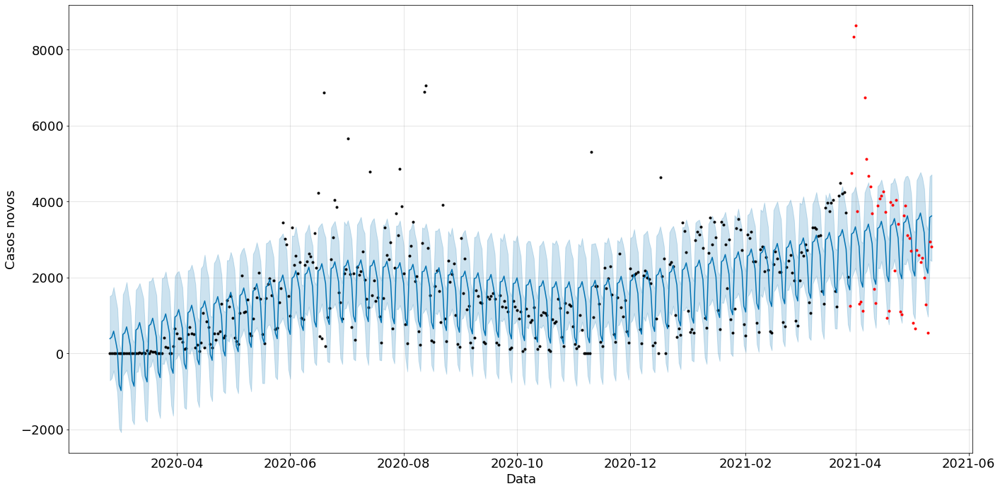

In [ ]:
#prevendo os últimos 45 dias dos dados:

future(45)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


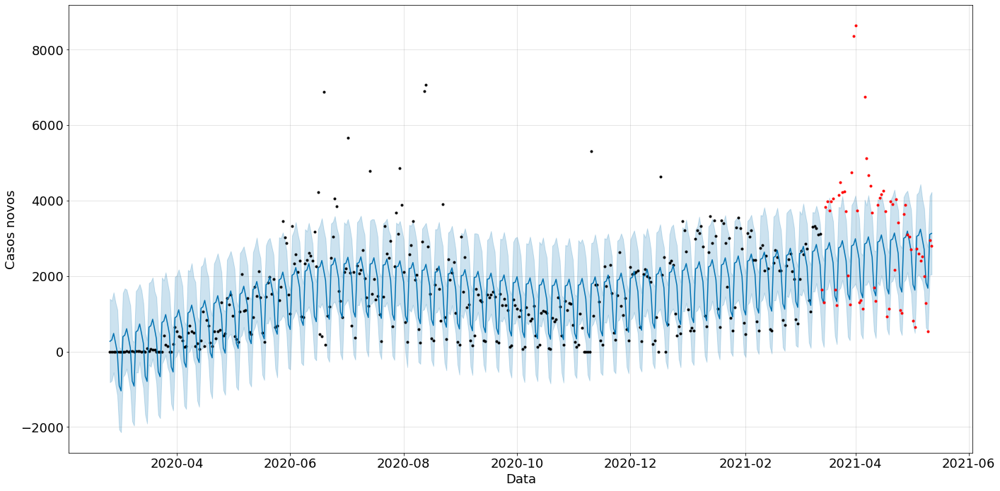

In [ ]:
#os ultimos 60 dias:

future(60)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


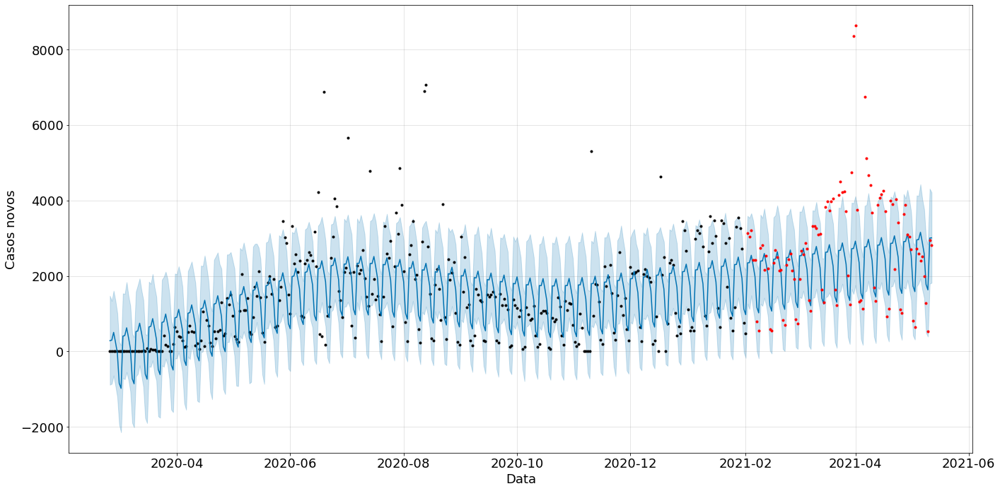

In [ ]:
#os ultimos 100:

future(100)

Vemos que quanto mais menos dias usamos para calibrar o nosso algoritmo menos a função que ele contrói fica inclinada no final, assim, pior fica a previsão dos dados testes.

Esse teste ressalta que precisamos melhorar os parâmetros do nosso modelo, que ele atualmente faz boas previsões apenas para um futuro próximo e que seria bom acharmos outras variáveis que contribuem para nossa previsão e trabalharmos com elas também.

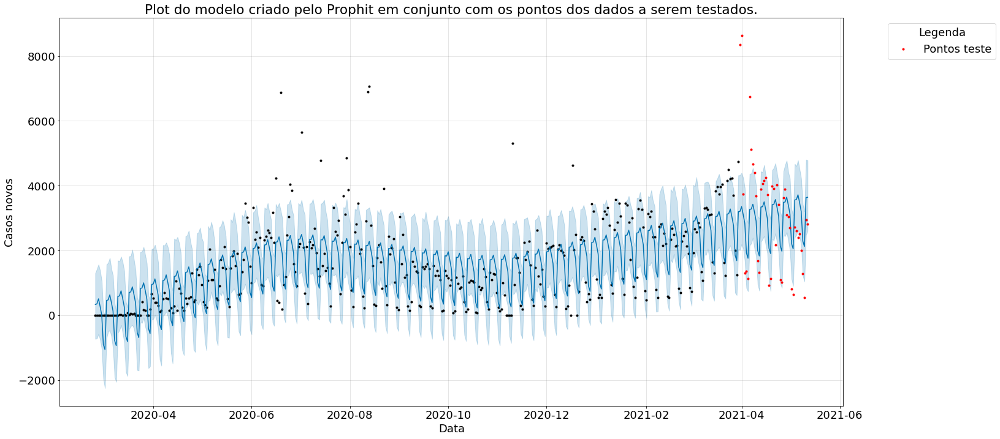

In [ ]:
#Desafio 3 - 2 - 3:

modelo.plot(previsao, xlabel='Data', ylabel='Casos novos', figsize=(20,10));
plt.plot(df_teste['ds'],df_teste['y'],'.r', label='Pontos teste')
plt.legend( title='Legenda', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Plot do modelo criado pelo Prophit em conjunto com os pontos dos dados a serem testados.')
plt.show()

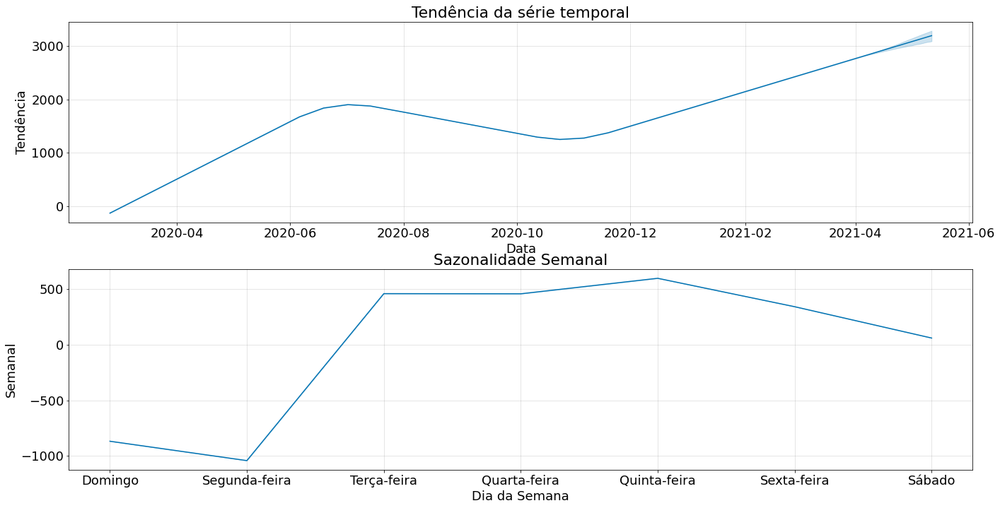

In [ ]:
ax = modelo.plot_components(previsao,figsize=(20,10));
eixos = ax.get_axes()
eixos[0].set_title('Tendência da série temporal')
eixos[0].set_ylabel('Tendência')
eixos[0].set_xlabel('Data')
eixos[1].set_title('Sazonalidade Semanal')
eixos[1].set_ylabel('Semanal')
eixos[1].set_xlabel('Dia da Semana')
eixos[1].set_xticks(range(0, 7))
eixos[1].set_xticklabels(['Domingo', 'Segunda-feira', 'Terça-feira', 'Quarta-feira', 'Quinta-feira', 'Sexta-feira'
                         ,'Sábado'])
plt.show()

In [ ]:
# Desafio 4 - 2 - 3: Fazer o processo de previsão para o número de casos acumulados:

def future2(nmr: int):
    df3 = pd.DataFrame()
    df3['ds'] = dados_sp['datahora'][:(443 - nmr)]
    df3['y'] = dados_sp['casos'][:(443 - nmr)]
    modelo3 = Prophet()
    modelo3.fit(df3)
    dataframefuturo3 = modelo3.make_future_dataframe(periods=nmr)
    previsao3 = modelo3.predict(dataframefuturo3)
    df_teste3 = pd.DataFrame()
    df_teste3['ds'] = dados_sp['datahora'][(443 - nmr):]
    df_teste3['y'] = dados_sp['casos'][(443 - nmr):]
    modelo3.plot(previsao3, xlabel='Data', ylabel='Casos acumulados', figsize=(20,10));
    plt.plot(df_teste3['ds'],df_teste3['y'],'.r')

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


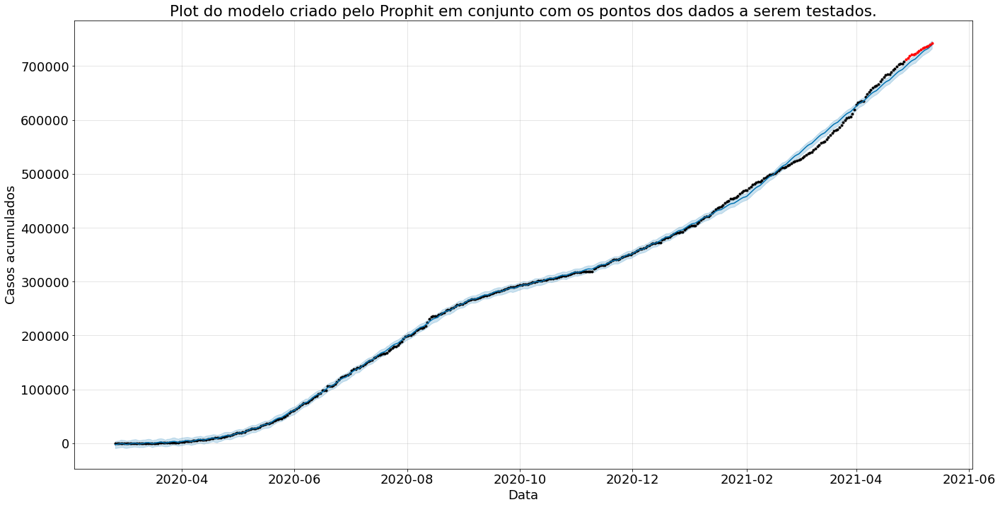

In [ ]:
future2(15)
plt.title('Plot do modelo criado pelo Prophit em conjunto com os pontos dos dados a serem testados.')
plt.show()

Usaremos agora uma funcionalidade do prophet para enxergar possíveis change points e fitar um modelo mais preciso.

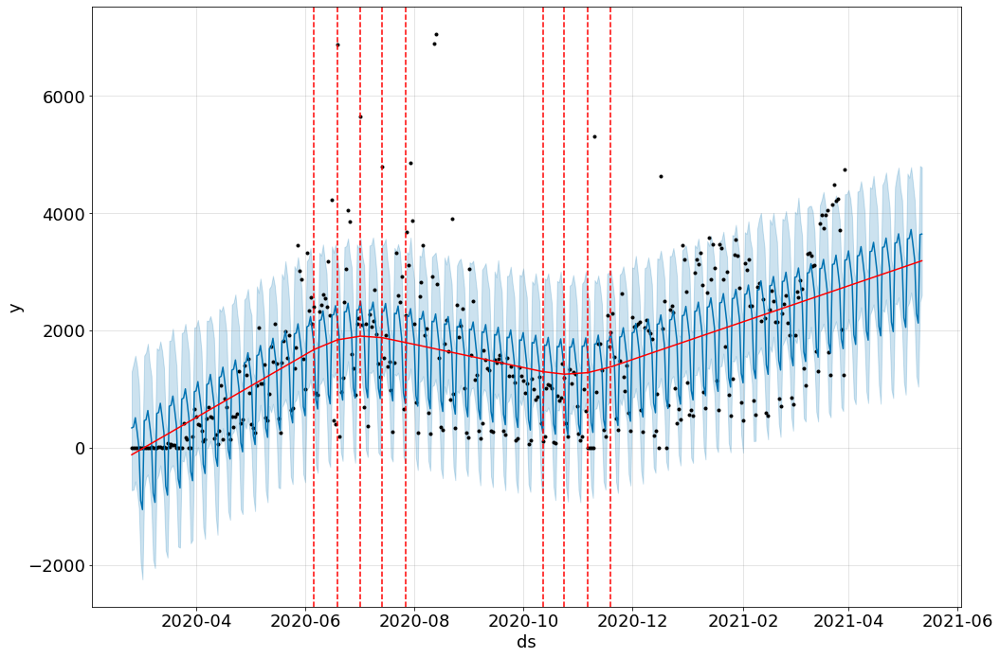

In [ ]:
fig = modelo.plot(previsao, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo, previsao)

In [ ]:
modelo = Prophet(n_changepoints=50)
modelo.fit(df)
dataframefuturo = modelo.make_future_dataframe(periods=43)
previsao = modelo.predict(dataframefuturo)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


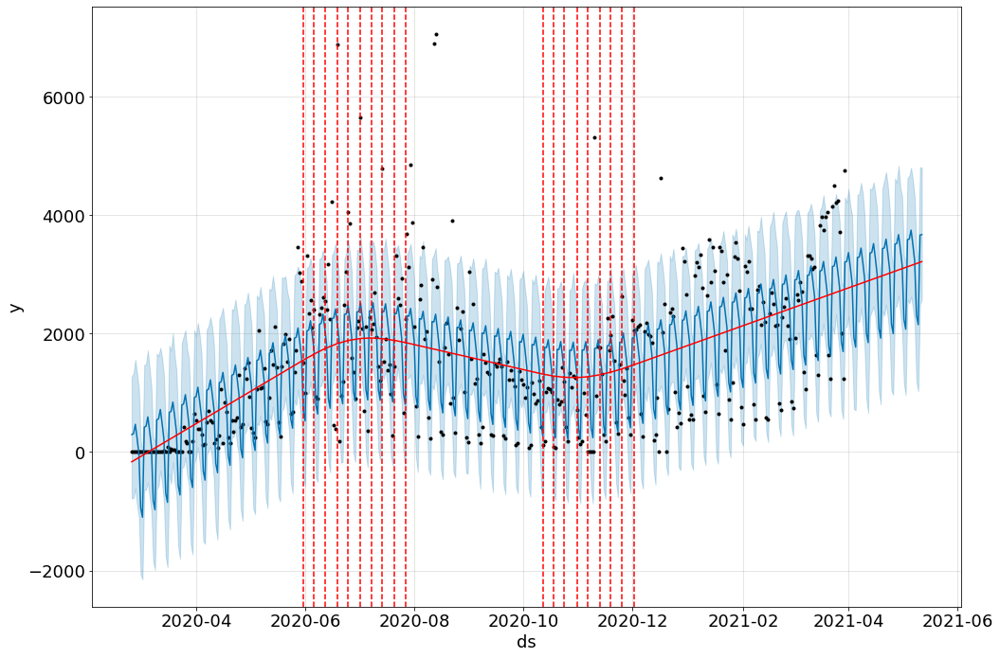

In [ ]:
fig = modelo.plot(previsao, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo, previsao)

Os changepoints são trabalhados juntos com a curva de tendência e parece que aumentar o número de change points não mudou muito a tendência. Aumentando o nmr de change points ele procura mais change points mas no final só adiciona os que melhor se encaixam com o fit dos dados.

Vamos mudar outro parâmetro que adicionará uma flexibilidade maior aos change points.

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


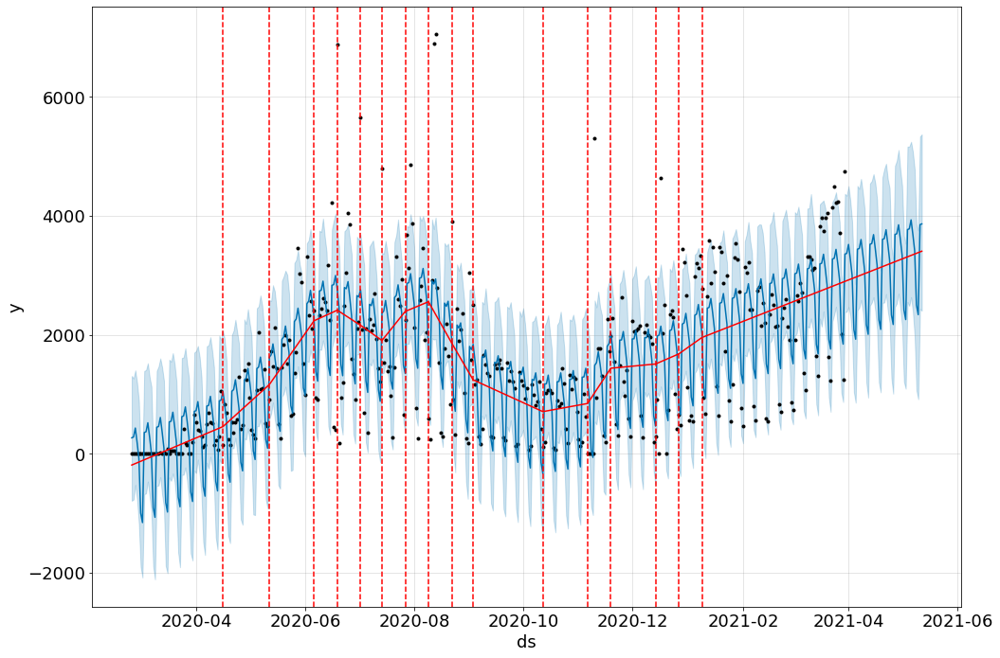

In [ ]:
modelo = Prophet(n_changepoints=25, changepoint_prior_scale = 10.0)
modelo.fit(df)
dataframefuturo = modelo.make_future_dataframe(periods=43)
previsao = modelo.predict(dataframefuturo)

fig = modelo.plot(previsao, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo, previsao)

Aumentando a flexibilidade também aumentamos a incerteza. Temos que ter cuidado com esse aumento de flexibilidade pois melhoramos o ajuste da nossa curva aos dados, contudo, podemos ter um overfit fazendo assim com que essa curva não se ajuste aos dados de teste e não nos gere uma boa previsão.

Aumentando o change pior scale é como se mudassemos a lente da lupa que estamos usando para ver os dados, assim, da forma que fizemos estamos usando uma lupa muito potente que está enxergando até as pequenas mudanças de padrão em nossos dados, logo, caindo na discussão anterior.

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


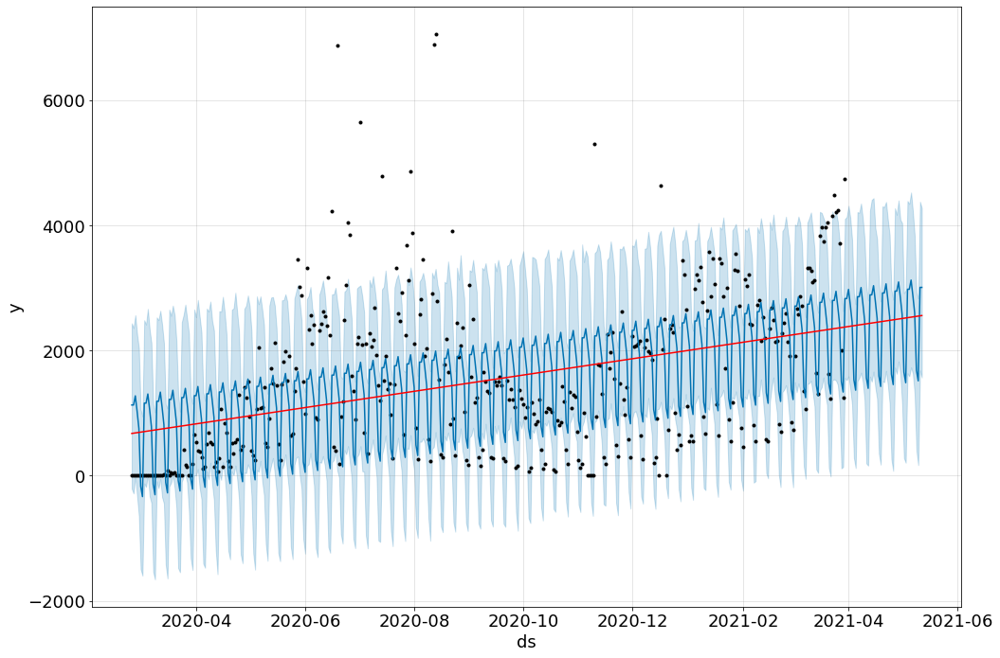

In [ ]:
#Vendo o lado oposto da moeda:

modelo = Prophet(n_changepoints=25, changepoint_prior_scale = 0.00005)
modelo.fit(df)
dataframefuturo = modelo.make_future_dataframe(periods=43)
previsao = modelo.predict(dataframefuturo)

fig = modelo.plot(previsao, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo, previsao)

### Desafio  1 - 3 - 3: identificar potenciais change point no gráfico de derivada da aula 1

(array([18322., 18383., 18444., 18506., 18567., 18628., 18687., 18748.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

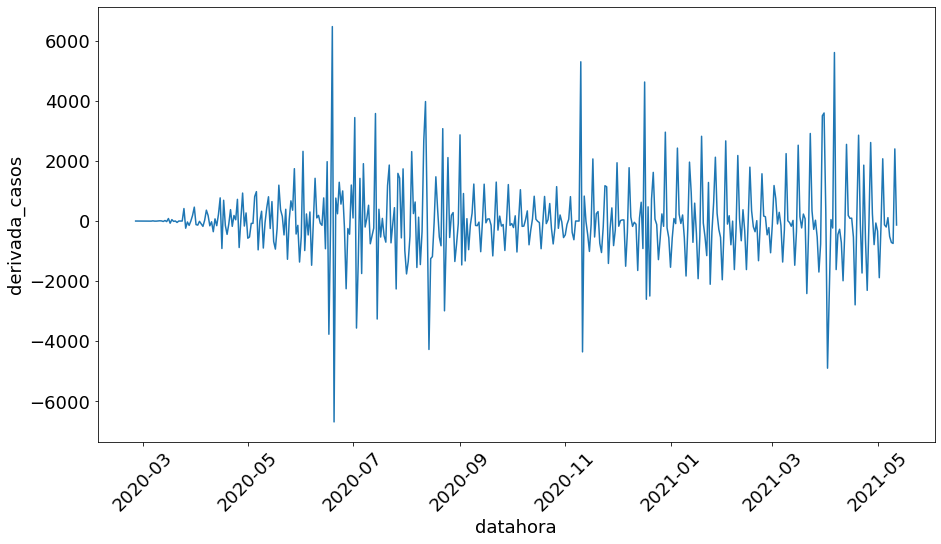

In [ ]:
#Desafio 1 - 3 - 3:

sns.lineplot(x='datahora', y='derivada_casos', data=dados_sp)
plt.xticks(rotation=45)

Primeiramente, observamos que os pontos onde a derivada está negativa e rapidamente vira positiva são change points, contudo, estamos querendo os que representam os padrões mais gerais do comportamento da variável e este ressaltado é um padrão que se repete com frequência, talvez ligado à sazionalidade. Percebemos que os padrões param de crescer um pouco antes de Julho voltando a crescer a partir de um pouco após Julho onde decrescem até em meados de agosto, decrescendo novamente até novembro, então, voltando a crescer até um pouco depois de Novembro. Mudança como essas podem ser observadas também em meados de dezembro de 2020 e abrild e 2021.

Alguns dos pontos que eu ressaltei parecem sim estar relacionados a change points.

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


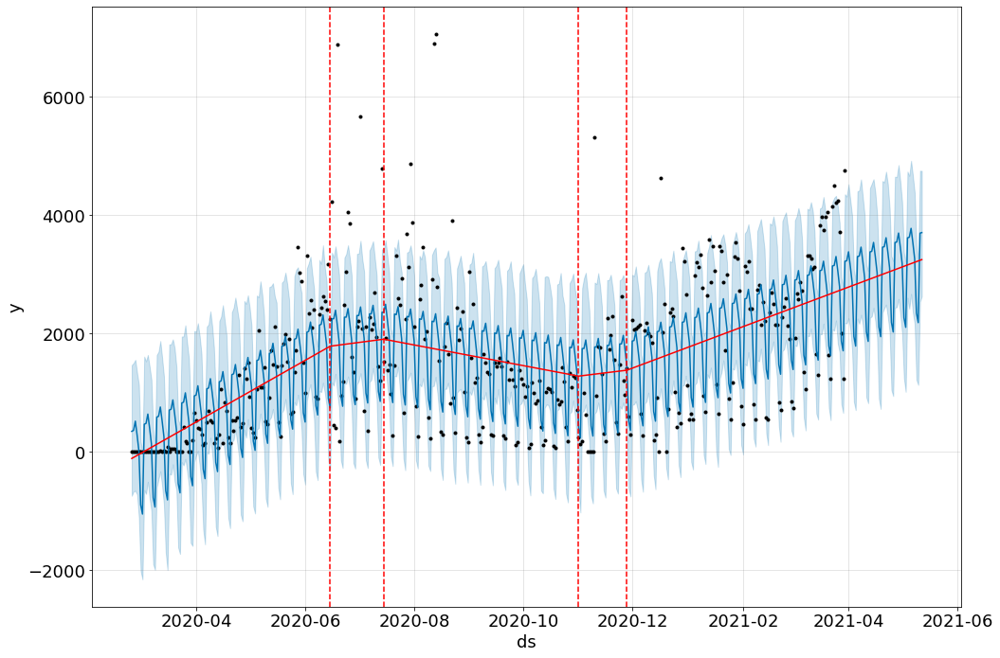

In [ ]:
#Adicionando esses pontos manualmente:

modelo = Prophet(changepoints=['2020-06-15','2020-07-15','2020-08-10',
                               '2020-11-01','2020-11-28','2020-12-20','2021-03-15'])
modelo.fit(df)
dataframefuturo = modelo.make_future_dataframe(periods=43)
previsao = modelo.predict(dataframefuturo)

fig = modelo.plot(previsao, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo, previsao)

### Desafio 2 - 3 - 3: Fazer uma função que roda as partes repetidas.


In [ ]:
#Desafio 2 - 3 - 3: Eu já fiz uma função, mas vou fazer uma mais geral:

def repetir(mod):
    mod.fit(df)
    dff = mod.make_future_dataframe(periods=43)
    prev = mod.predict(dff)
    fig = mod.plot(prev, figsize=(15,10))
    a = add_changepoints_to_plot(fig.gca(), mod, prev)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


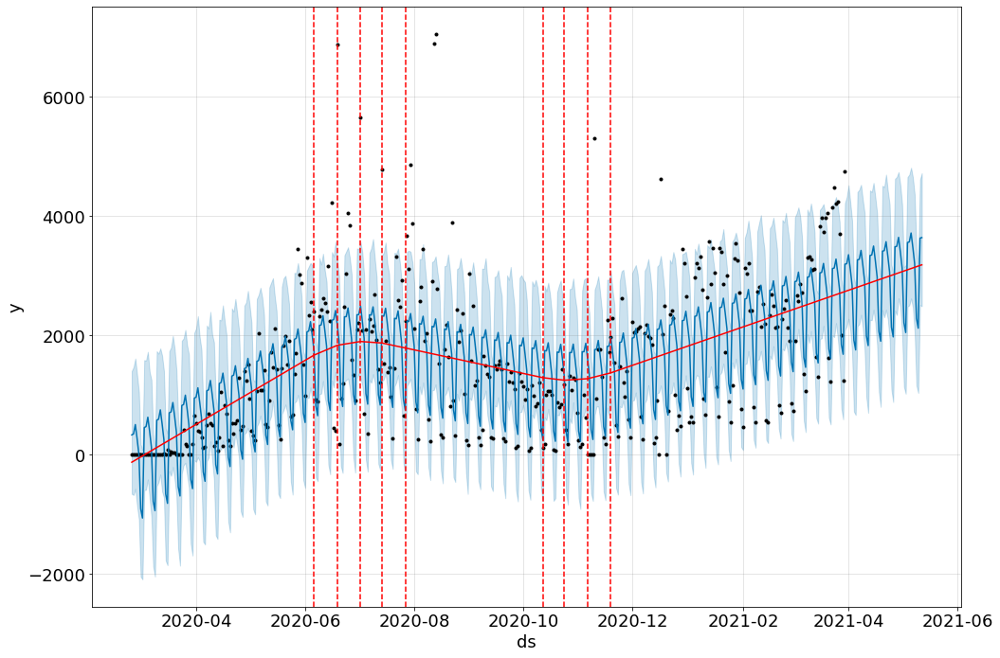

In [ ]:
#teste:
modelo = Prophet()

repetir(modelo)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


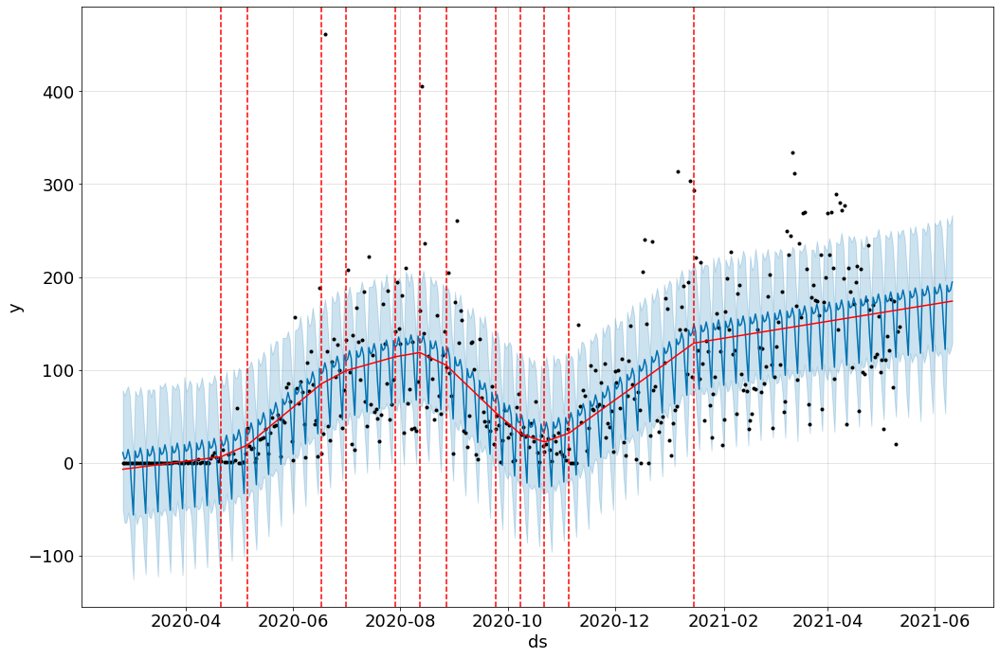

In [ ]:
#Modelo para a cidade de Jundiaí:

dfj = pd.DataFrame()
dfj['ds'] = dados_jund['datahora']
dfj['y'] = dados_jund['casos_novos']
modelo = Prophet(changepoint_prior_scale = 1.0)
modelo.fit(dfj)
dataframefuturo = modelo.make_future_dataframe(periods=30)
previsao = modelo.predict(dataframefuturo)
fig = modelo.plot(previsao, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo, previsao)

Voltando ao gráfico de casos da aula 1, onde plotamos os meses de Janeiro e Fevereiro conseguimos enxergar a sazonalidade semanal, que já haviamos pontuado, e além disso que também nos dias 1,2 e 25 de Janeiro temos uma notificaçao de casos muito baixa, assim, nos chama atenção também para feriados, onde os primeiros dias de Janeiro correspondem ao ano novo e o dia 25 ao aniversário da cidade.

Há uma funcionalidade para adicionar os feriados:


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


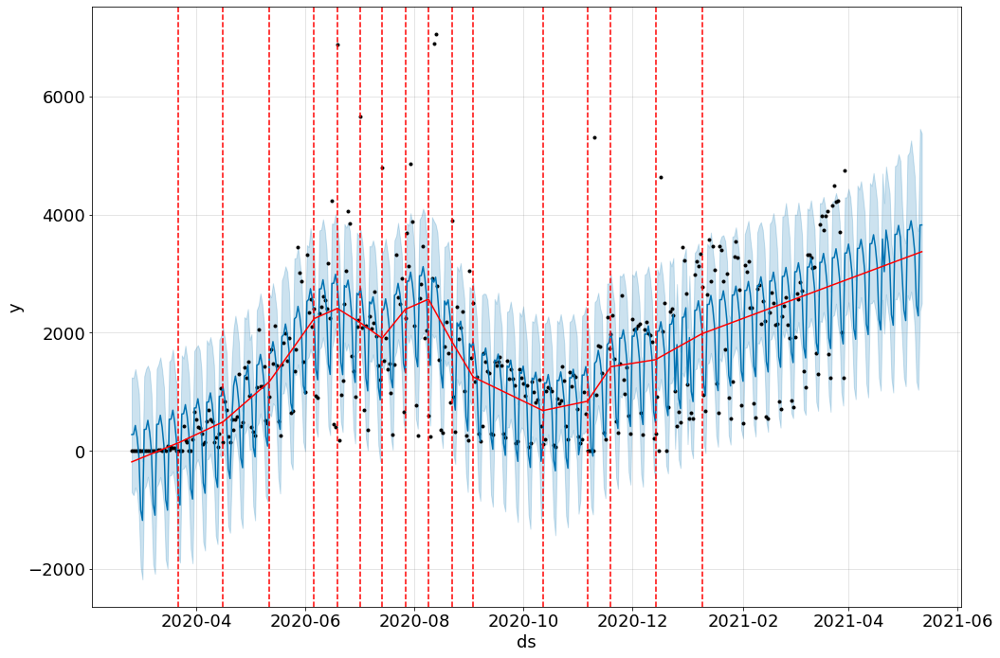

In [ ]:
modelo = Prophet(changepoint_prior_scale=10)
#Alan voltou a usar o changepoint prior scale em 10 argumentando que estava fitando bem nos dados
modelo.add_country_holidays(country_name='BR')
repetir(modelo)

Além disso a Karoline apontou que seria melhor ainda incluirmos os feriados do município de São Paulo também, assim, foi montado uma lista com todos eles e nas datas que foram adiantados por conta da pandemia.

In [ ]:
feriados_sp_2020 = [
'2020-02-25',
'2020-02-26',
'2020-04-10',
'2020-02-25',
'2020-02-26',
'2020-04-10',
'2020-04-21',
'2020-05-01',
'2020-05-20',
'2020-05-21', 
'2020-05-22',
'2020-05-25',
'2020-06-11',
'2020-09-07',
'2020-10-12',
'2020-11-02',
'2020-11-15',
'2020-12-25'
]

feriados_sp_2021 = [
'2021-01-01',
'2021-01-25',
'2021-02-15',
'2021-02-16',
'2021-02-17',
'2021-03-26',
'2021-03-29',
'2021-03-30',
'2021-03-31',
'2021-04-01',
'2021-04-02',
'2021-04-21',
'2021-05-01'
]

In [ ]:
feriados_sp_2020 = pd.DataFrame({'holiday': 'sp_2020',
                                'ds': pd.to_datetime(feriados_sp_2020)})

In [ ]:
feriados_sp_2020.head()

,holiday,ds
0,sp_2020,2020-02-25
1,sp_2020,2020-02-26
2,sp_2020,2020-04-10
3,sp_2020,2020-02-25
4,sp_2020,2020-02-26


In [ ]:
feriados_sp_2021 = pd.DataFrame({'holiday': 'sp_2021',
                                'ds': pd.to_datetime(feriados_sp_2021)})

In [ ]:
feriados = pd.concat((feriados_sp_2020, feriados_sp_2021))
feriados

,holiday,ds
0,sp_2020,2020-02-25
1,sp_2020,2020-02-26
2,sp_2020,2020-04-10
3,sp_2020,2020-02-25
4,sp_2020,2020-02-26
5,sp_2020,2020-04-10
6,sp_2020,2020-04-21
7,sp_2020,2020-05-01
8,sp_2020,2020-05-20
9,sp_2020,2020-05-21


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


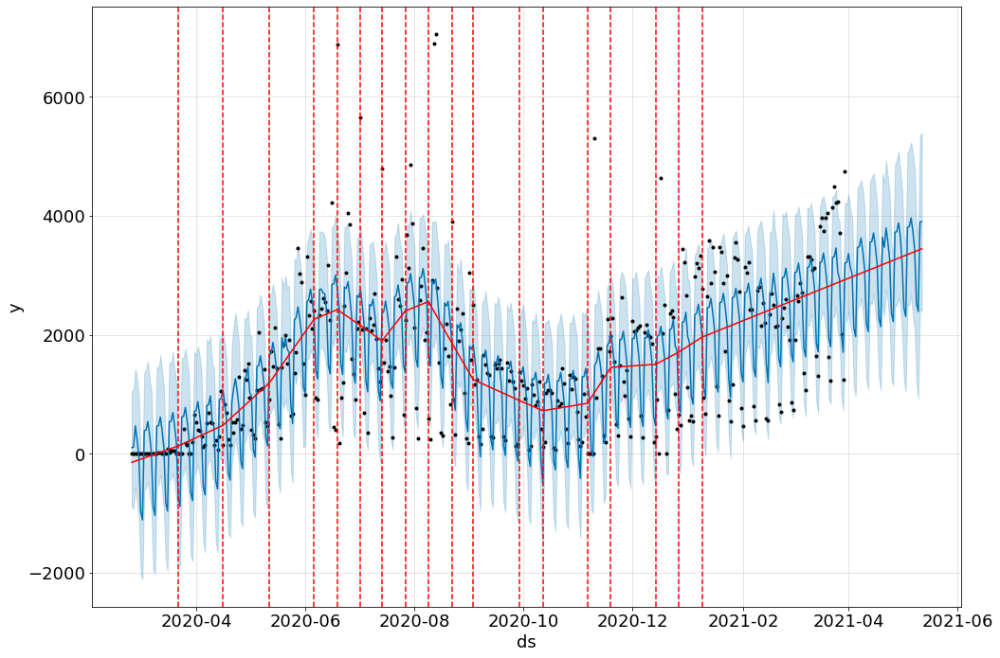

In [ ]:
modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados)
modelo_feriados.fit(df)
dff = modelo_feriados.make_future_dataframe(periods=43)
prev = modelo_feriados.predict(dff)
fig = modelo_feriados.plot(prev, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo_feriados, prev)

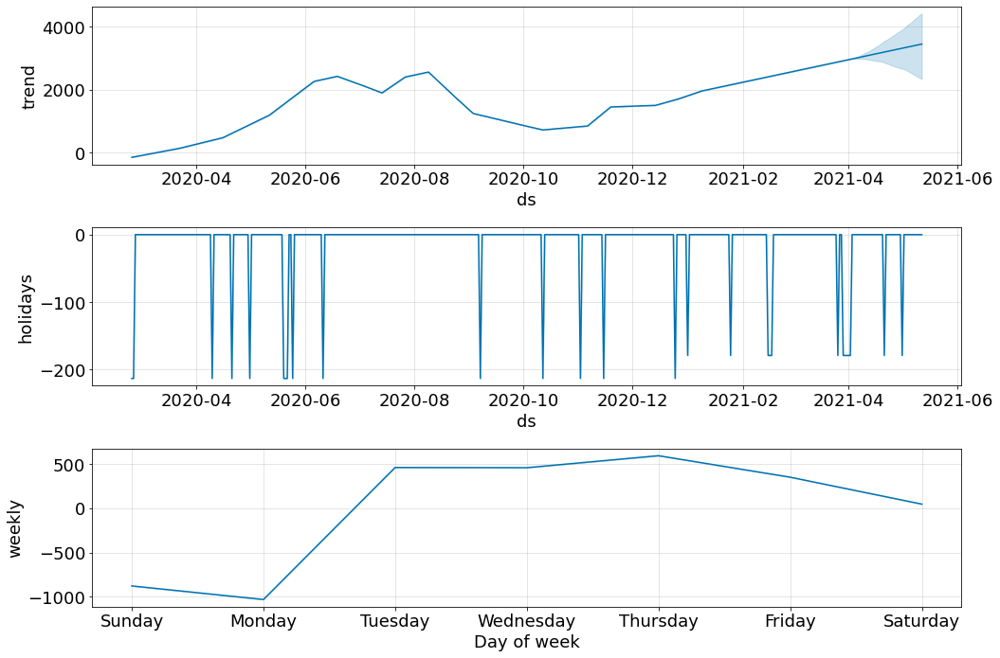

In [ ]:
modelo_feriados.plot_components(prev, figsize=(15,10));

O próprio prophet notou que os feriados de 2020 tem um impacto maior que os de 2021 e os reporta agora em gráfico de holidays.

Um ponto que merece ressalva é que estamos analisando os casos NOTIFICADOS, assim, quando detectamos que há um menor número de casos notificados nos feriados e finais de semana temos que nos questionar se esse menor número é devido ao número de casos ser realmente menor ou se eles não estão sendo notificados.

Iremos focar na sazonalidade agora, o prophet já detecta uma sazonalidade semanal, então o questionamento que fica é se ela é aditiva ou multiplicativa. O prophet por padrão tem que a sazonalidade é definida como aditiva. Mediremos o quão bom nosso fit é, usaramos uma métrica para isso:

In [ ]:
#Sazonalidade aditiva:

mean_absolute_error(df['y'],prev['yhat'][:400])

#quanto mais prox de zero melhor o resultado.

536.6256416750042

In [ ]:
#Vamos testar agora a sazonalidade multiplicativa:

modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados
                         ,seasonality_mode='multiplicative')
modelo_feriados.fit(df)
dff = modelo_feriados.make_future_dataframe(periods=43)
prev = modelo_feriados.predict(dff)

mean_absolute_error(df['y'],prev['yhat'][:400])


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


452.5429430162905

A sazonalidade multiplicativa gera um ajuste melhor aos nossos dados de treino.

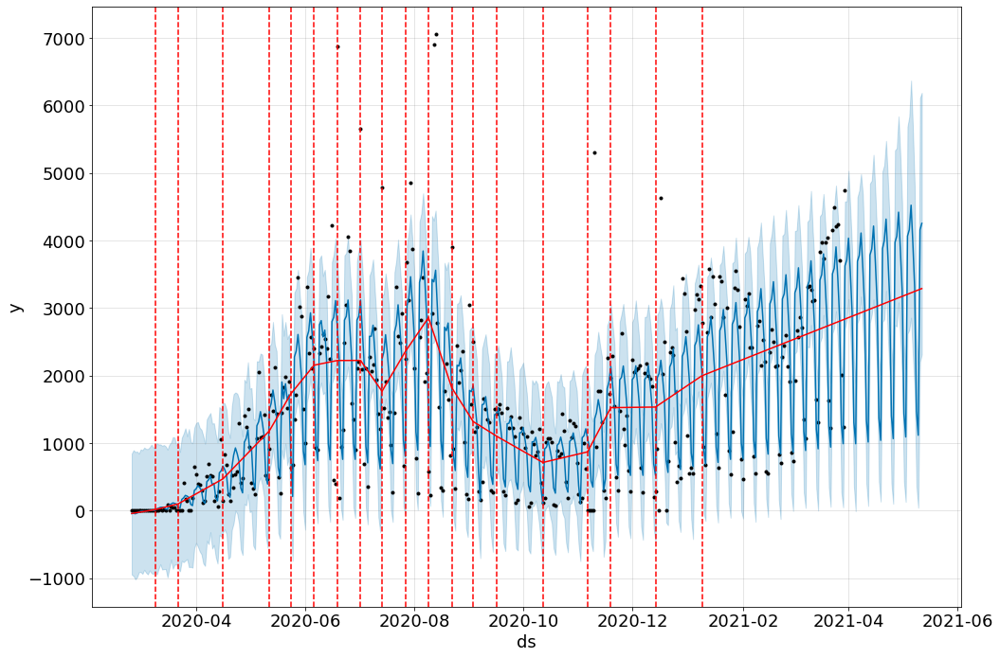

In [ ]:
#Vamos ver graficamente:

fig = modelo_feriados.plot(prev, figsize=(15,10))
a = add_changepoints_to_plot(fig.gca(), modelo_feriados, prev)

### Desafio 1 - 4 - 3: Plotar esse gráfico com linhas ao invés de pontos pretos.

<AxesSubplot:xlabel='ds', ylabel='y'>

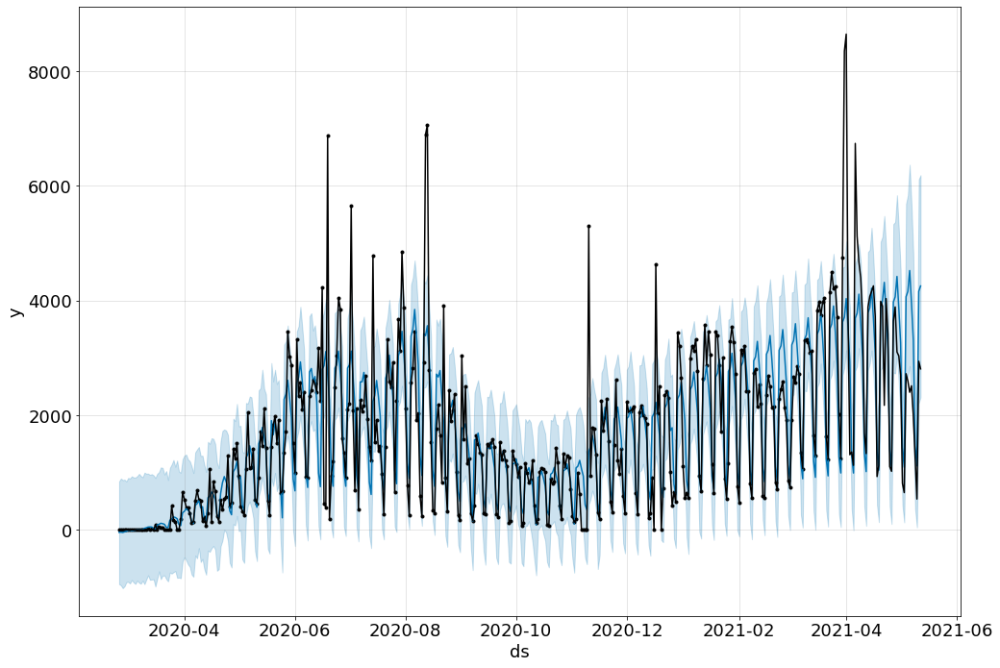

In [ ]:
modelo_feriados.plot(prev, figsize=(15,10));
sns.lineplot(x=dados_sp['datahora'][:], y=dados_sp['casos_novos'][:], data=dados_sp, color='black' )

### Desafio 2 - 4 - 3 : Usar outras métricas para verificar a qualidade dos modelos:

In [ ]:
#Vamos testar agora a sazonalidade aditiva:

modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados)
modelo_feriados.fit(df)
dff = modelo_feriados.make_future_dataframe(periods=43)
prev = modelo_feriados.predict(dff)

display(explained_variance_score(df['y'],prev['yhat'][:400]))
display(median_absolute_error(df['y'],prev['yhat'][:400]))
display(r2_score(df['y'],prev['yhat'][:400]))

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


0.6328520120559533

394.76889743857294

0.6328520119794676

In [ ]:
#Vamos testar agora a sazonalidade multiplicativa:

modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados
                         ,seasonality_mode='multiplicative')
modelo_feriados.fit(df)
dff = modelo_feriados.make_future_dataframe(periods=43)
prev = modelo_feriados.predict(dff)

display(explained_variance_score(df['y'],prev['yhat'][:400]))
display(median_absolute_error(df['y'],prev['yhat'][:400]))
display(r2_score(df['y'],prev['yhat'][:400]))

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


0.6849287648420535

268.1996499283673

0.6849225785190073

Funções que tem o score retornam valores para se maximizar, assim, quanto maior melhor. Funções com error retornam valores a serem minimizados, assim, quanto menor melhor. Nesses 3 parâmetros sazonalidade multiplicativa leva vantagem, evidenciando que este modelo é melhor.

o método explained variance score faz o cálculo :

$$explained variance(y,ŷ) = 1 - \frac{Var(y - ŷ)}{Var(y)} $$

onde Var é a variância, que é o quadrado do desvio padrão.

já o R² é dado por:

$$R²(y,ŷ) = 1 - \frac{\sum_{i=1}^{n}(y_i - ŷ_i)²}{\sum_{i=1}^{n}(y_i - ymed_i)²} $$

e o median absolute error é a incerteza associada à média absoluta.

Iremos agora tratar dos outliers, que são valores muito fora do padrão, que após tratados podemos obter um algoritmo muito mais preciso do que o atual. No momento o tratamento que iremos dar será a remoção dos pontos que estiverem muito fora do padrão.

In [ ]:
novo_y = df.reset_index()
novo_y

,index,ds,y
0,562,2020-02-25,0
1,1207,2020-02-26,0
2,1852,2020-02-27,0
3,2497,2020-02-28,1
4,3142,2020-02-29,0
...,...,...,...
395,255337,2021-03-26,4241
396,255982,2021-03-27,3709
397,256627,2021-03-28,2010
398,257272,2021-03-29,1242


In [ ]:
sem_out = novo_y[(novo_y['y'] > prev['yhat_lower'][:400]) & (novo_y['y'] < prev['yhat_upper'][:400])]
sem_out

,index,ds,y
0,562,2020-02-25,0
1,1207,2020-02-26,0
2,1852,2020-02-27,0
3,2497,2020-02-28,1
4,3142,2020-02-29,0
...,...,...,...
394,254692,2021-03-25,4214
395,255337,2021-03-26,4241
396,255982,2021-03-27,3709
397,256627,2021-03-28,2010


Estamos selecionando apenas os pontos que estão dentro do intervalo de confiança.

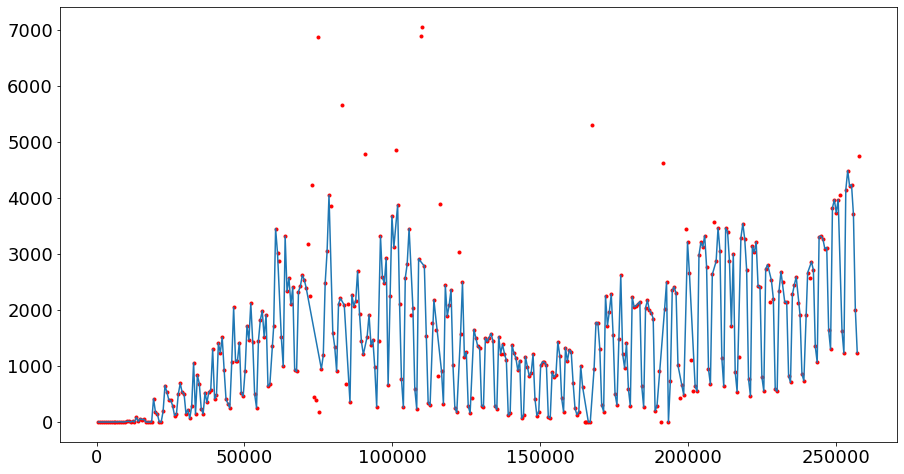

In [ ]:
plt.plot(df.index, df['y'], 'r.')
plt.plot(sem_out['index'], sem_out['y'])

In [ ]:
df_sem_out = sem_out[['ds','y']]
df_sem_out

,ds,y
0,2020-02-25,0
1,2020-02-26,0
2,2020-02-27,0
3,2020-02-28,1
4,2020-02-29,0
...,...,...
394,2021-03-25,4214
395,2021-03-26,4241
396,2021-03-27,3709
397,2021-03-28,2010


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


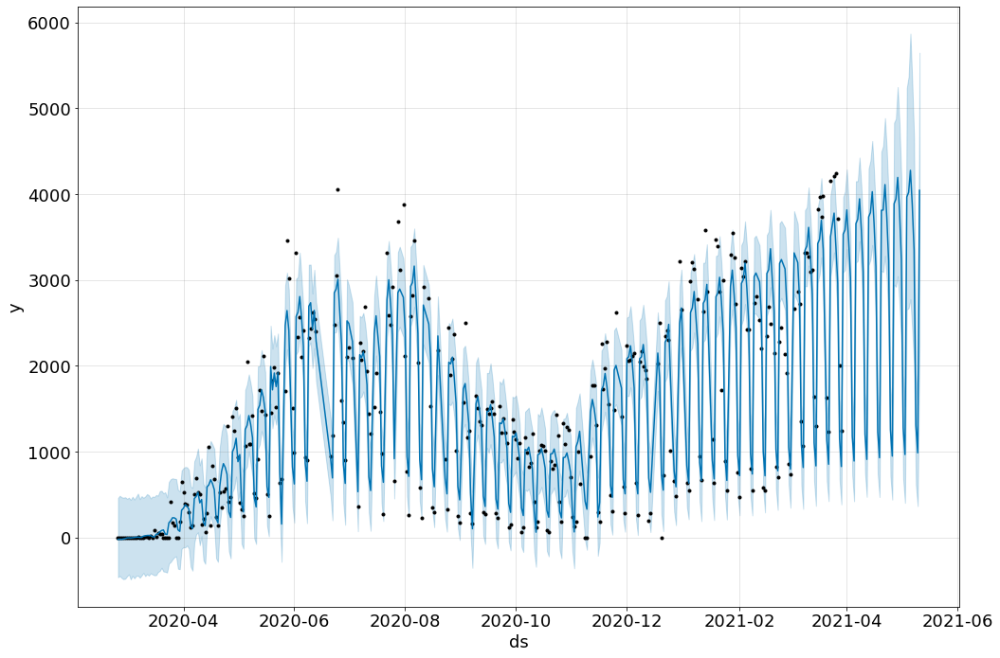

In [ ]:
#Rodando os comandos para o prophet gerar um ajuste com o novo dataframe:

modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados,
                         seasonality_mode='multiplicative')
modelo_feriados.fit(df_sem_out)
dff = modelo_feriados.make_future_dataframe(periods=43)
prev = modelo_feriados.predict(dff)
fig = modelo_feriados.plot(prev, figsize=(15,10));

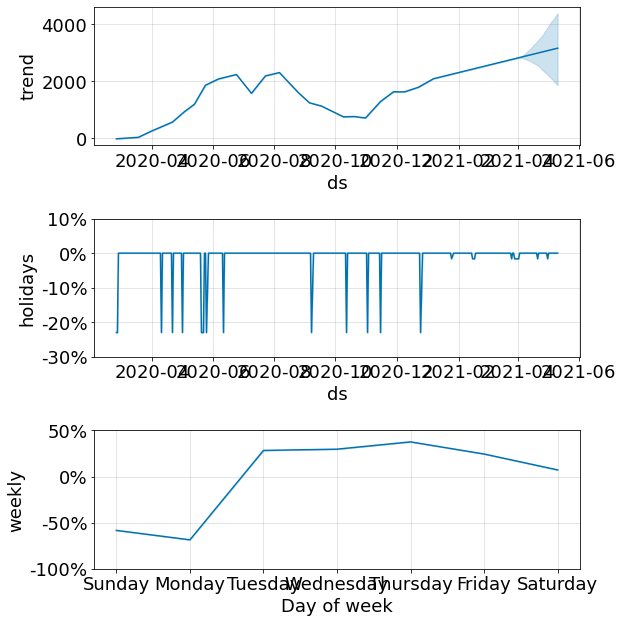

In [ ]:
modelo_feriados.plot_components(prev);

In [ ]:
amostras = modelo_feriados.predictive_samples(prev)

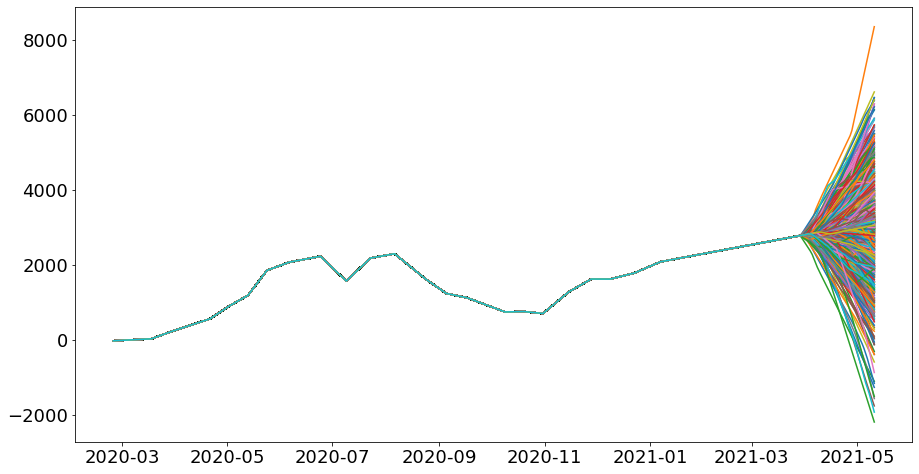

In [ ]:
plt.plot(prev['ds'],amostras['trend']);

O ajuste do prophet é muito parecido com o ajuste de uma reta, precisamos estimar os coeficientes a e b da reta, só que para estimar os coeficientes desse modelo mais complexo ele "chuta" valores pra esses coeficientes e vai ajustando a cada tentativa até chegar em um ajuste bom para os dados. Como ele chutou coeficientes ele poderia ter chego em uma solução diferente se ele tivesse chutado valores diferentes. Então quantas soluções diferentes poderiamos ter? Nesse caso tivemos aproximadamente 1000 respostas diferentes que se encontram dentro do intervalo de confiança da tendência.

Podemos vizualizar esse método também para o próprio ajuste dos dados e seu intervalo de confiança.

### Desafio 1 - 5 - 3: Testar outros intervalos de confiança.

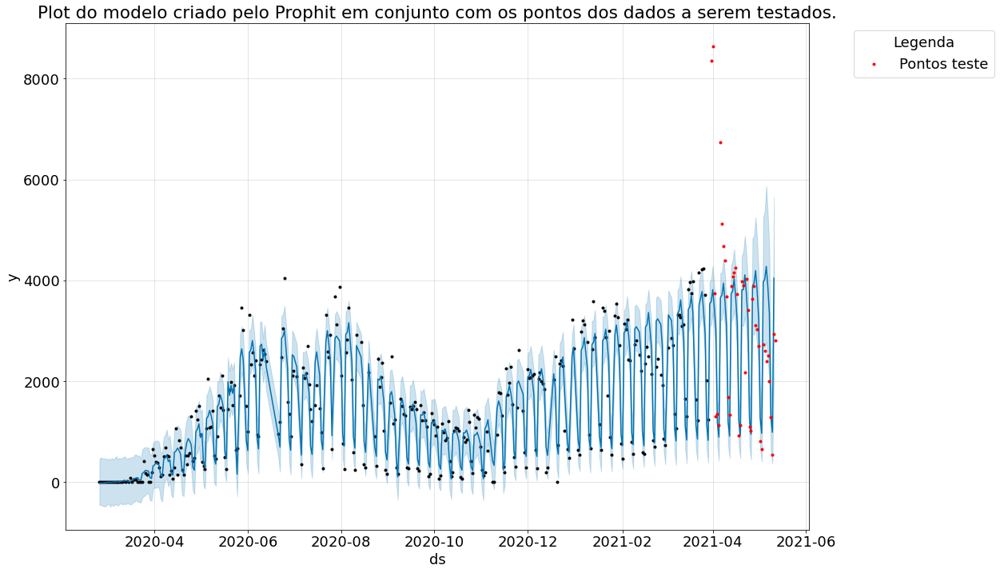

In [ ]:
#Plotando com os pontos de teste:

fig = modelo_feriados.plot(prev, figsize=(15,10));
plt.plot(df_teste['ds'],df_teste['y'],'.r', label='Pontos teste')
plt.legend( title='Legenda', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Plot do modelo criado pelo Prophit em conjunto com os pontos dos dados a serem testados.')
plt.show()

In [ ]:
#Para o modelo atual temos:

MAerror = mean_absolute_error(df_sem_out['y'],prev['yhat'][:len(df_sem_out)])

r2 = r2_score(df_sem_out['y'],prev['yhat'][:len(df_sem_out)])

print(f'O erro sob a média absoluta para os dados de treino foi de {MAerror} e o R² foi {r2}.')

O erro sob a média absoluta para os dados de treino foi de 266.2117316527772 e o R² foi 0.8932338103570262.


In [ ]:
#Quanto aos dados de teste:

MAerror = mean_absolute_error(df_teste['y'],prev['yhat'][len(df_sem_out):])

r2 = r2_score(df_teste['y'],prev['yhat'][len(df_sem_out):])

print(f'O erro sob a média absoluta para os dados de teste foi de {MAerror} e o R² foi {r2}.')

O erro sob a média absoluta para os dados de teste foi de 1425.1777949148457 e o R² foi -0.15617235019025744.


Parece então que temos um overfitting dos dados aqui pois nosso modelo gera um fit ótimo aos dados de treino, contudo, ao predizer dados para os números de casos futuros ele tem resultados ruims.

In [ ]:
#Desafio 1 - 5 - 3: Testando outros intervalos de confiança:
def modelconf(n:float):
    modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados,
                         seasonality_mode='multiplicative',
                         interval_width=n)
    modelo_feriados.fit(df_sem_out)
    dff = modelo_feriados.make_future_dataframe(periods=43)
    prev = modelo_feriados.predict(dff)
    fig = modelo_feriados.plot(prev, figsize=(15,10));
    plt.plot(df_teste['ds'],df_teste['y'],'.r', label='Pontos teste')
    plt.legend( title='Legenda', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title('Plot do modelo criado pelo Prophit em conjunto com os pontos dos dados a serem testados.')
    plt.show()
    modelo_feriados.plot_components(prev);
    amostras = modelo_feriados.predictive_samples(prev)
    plt.show()
    plt.plot(prev['ds'],amostras['trend']);

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


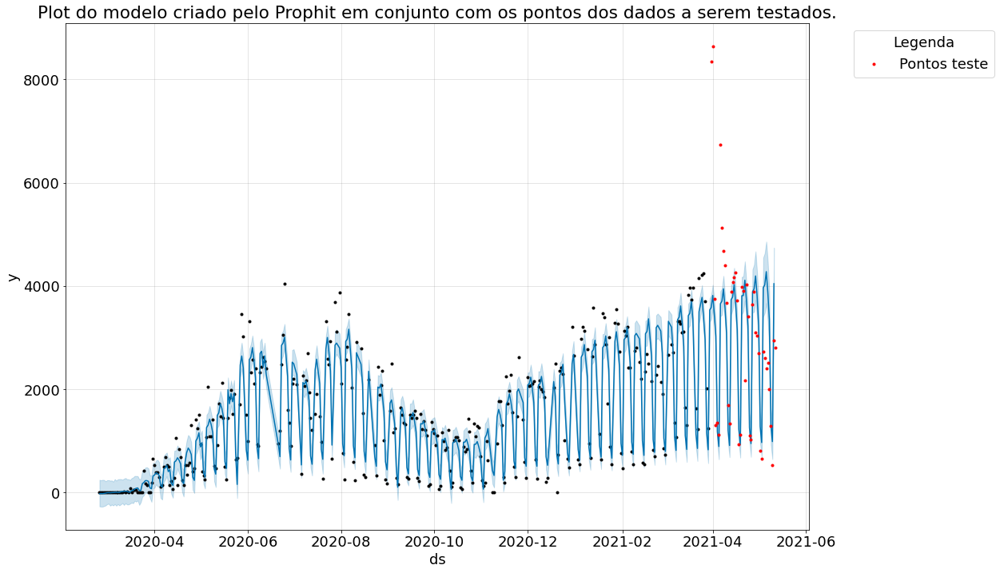

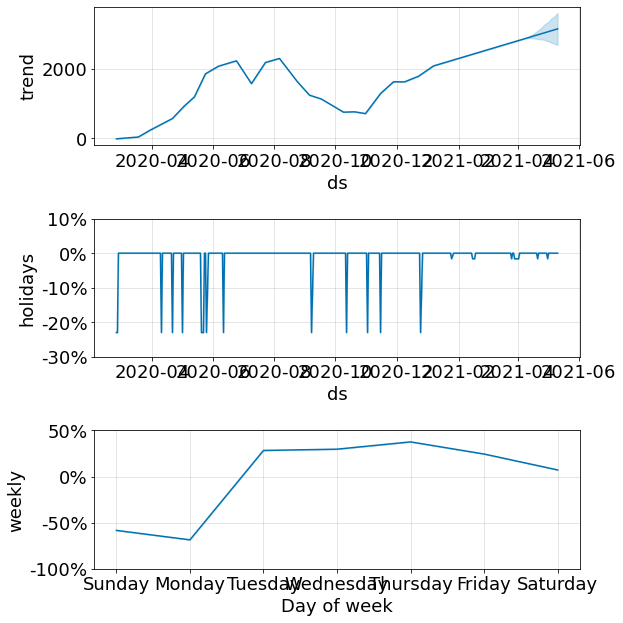

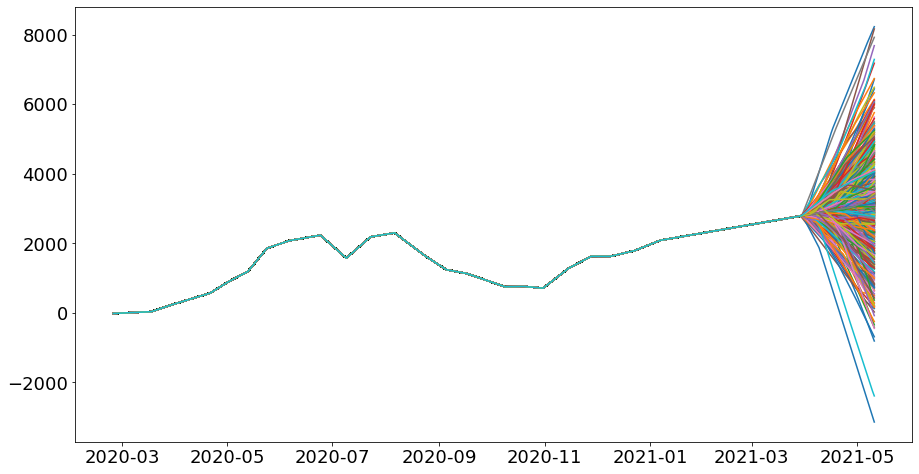

In [ ]:
modelconf(0.5)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


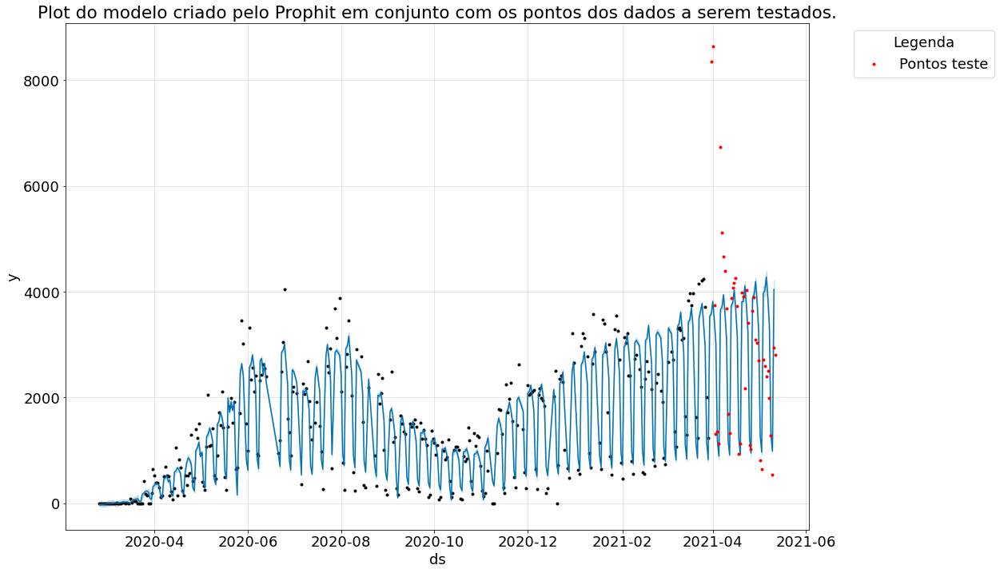

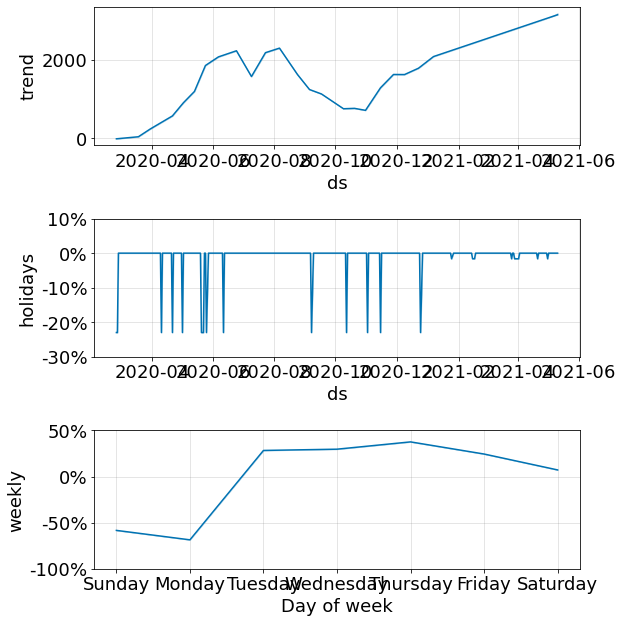

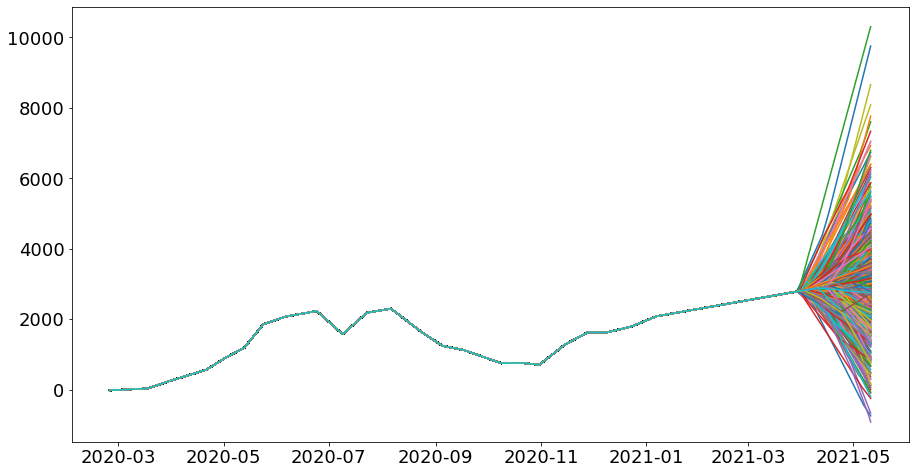

In [ ]:
modelconf(0.1)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


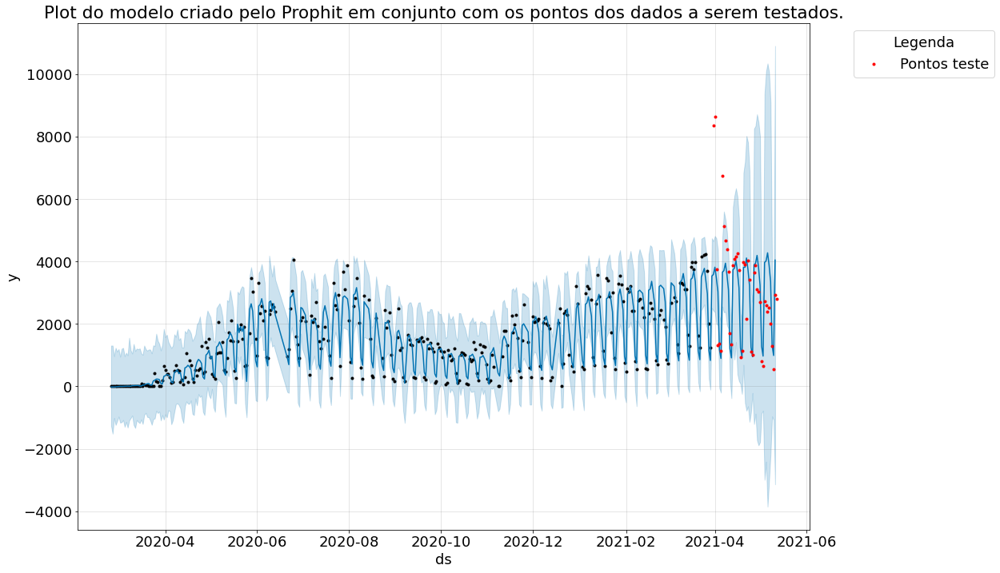

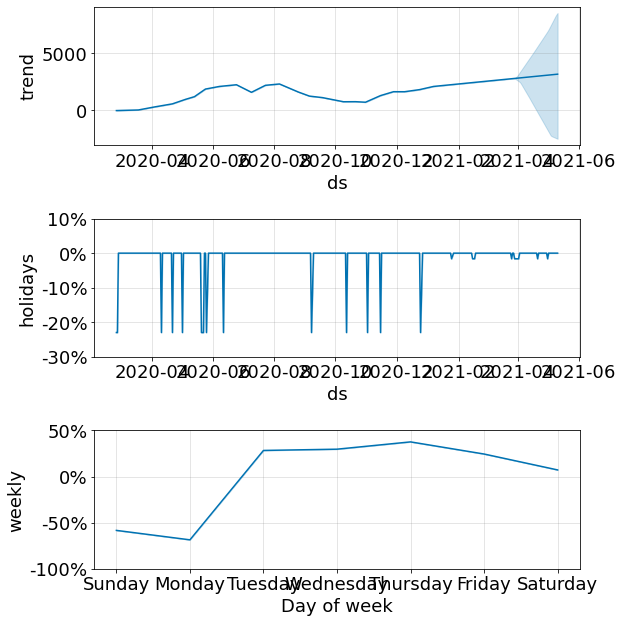

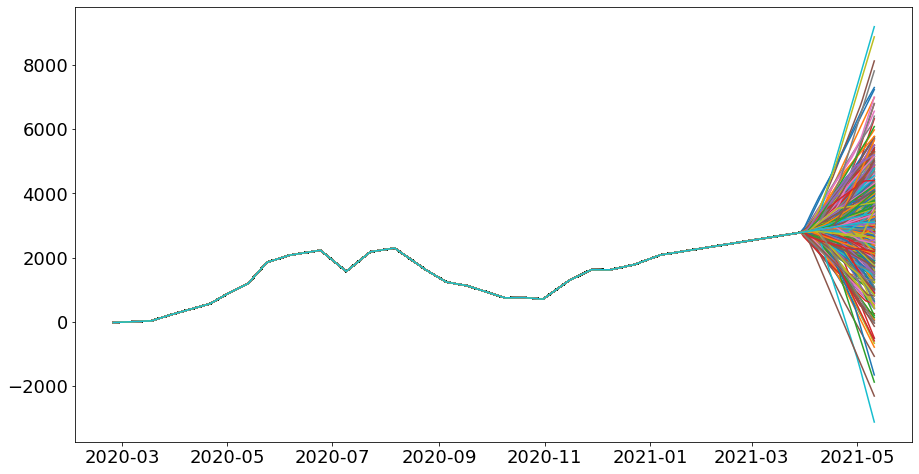

In [ ]:
modelconf(1)

Aparentemente alterado esse parâmetro nos mexemos com o intervalo de confiança do nosso fit, mexendo também no intervalo de confiança da tendência prevista, contudo, alterando de certa forma o padrão dos chutes da predição da tendência mas não os limitando da maneira que imaginei, por exemplo, ao usar o width como 0.1 eu imaginava que os gráfico que mostra os predctive samples seria mais "enxuto", com chutes iniciais muito próximos à reta do fit, o que não ocorreu.

Fora isso a mudança da largura do intervalo de confiança não mudou nenhuma das métricas para verificação de qualidade do fit utilizadas previamente.

Na última parte da aula 5 iremos trabalhar com métricas de avaliação, começando com o cross validation do próprio prophet:


In [ ]:
#rodando novamento pq usei todos com o mesmo nome o último modelo salvo era com intervalo de confiança não padrão.

modelo_feriados = Prophet(changepoint_prior_scale=10.0, holidays=feriados,
                         seasonality_mode='multiplicative')
modelo_feriados.fit(df_sem_out)
dff = modelo_feriados.make_future_dataframe(periods=43)
prev = modelo_feriados.predict(dff)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
df_cv = cross_validation(modelo_feriados, initial='180 days', period='30 days', horizon='30 days')

INFO:prophet:Making 7 forecasts with cutoffs between 2020-08-31 00:00:00 and 2021-02-27 00:00:00


In [ ]:
janela = 1

In [ ]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-09-02,1930.563841,1438.930738,2331.364261,1579,2020-08-31
1,2020-09-03,2118.130137,1668.748028,2557.560805,2496,2020-08-31
2,2020-09-04,2034.149129,1559.390864,2496.781288,1166,2020-08-31
3,2020-09-05,1507.971707,1005.611511,1993.638131,1245,2020-08-31
4,2020-09-06,642.664281,196.179847,1058.098700,290,2020-08-31


In [ ]:
cutoff = df_cv['cutoff'].unique()[janela]
cutoff

numpy.datetime64('2020-09-30T00:00:00.000000000')

In [ ]:
df_cv_cut = df_cv[df_cv['cutoff'].values == cutoff]

Text(0.5, 0, 'ds')

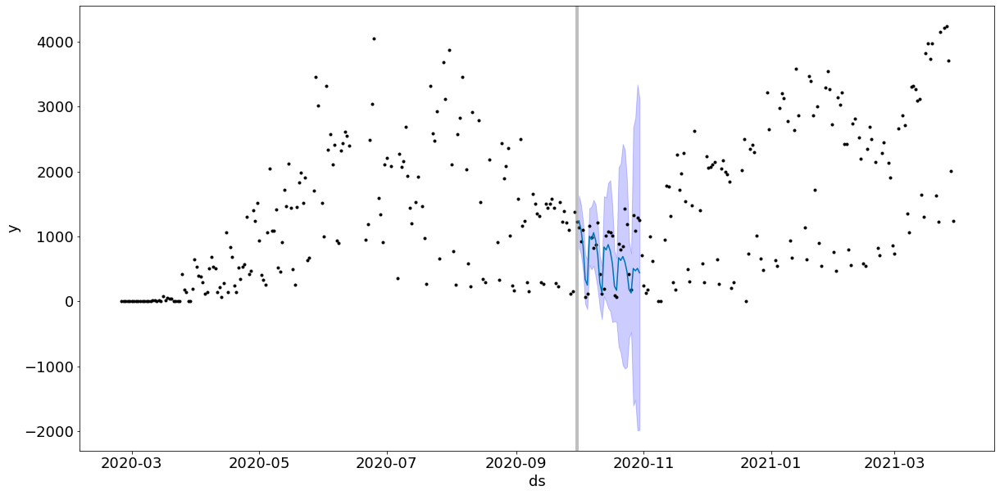

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)
ax.plot(modelo_feriados.history['ds'].values, modelo_feriados.history['y'], 'k.')
ax.plot(df_cv_cut['ds'].values, df_cv_cut['yhat'], ls='-', c='#0072B2')
ax.fill_between(df_cv_cut['ds'].values, df_cv_cut['yhat_lower'],
               df_cv_cut['yhat_upper'], color='blue',
               alpha=0.2)
ax.axvline(x=pd.to_datetime(cutoff), c='gray', lw=4, alpha=0.5)
ax.set_ylabel('y')
ax.set_xlabel('ds')

Esse gráfico mostra que nós fizemos um algoritmo que usou todos os pontos pretos antes da linha cinza para treino e depois ele usou um pequeno trecho para testar o modelo resultante. O Alan falou que ele não está fazendo somente isso, vamos mudar a janela para 5 agora.

In [ ]:
janela = 5

Text(0.5, 0, 'ds')

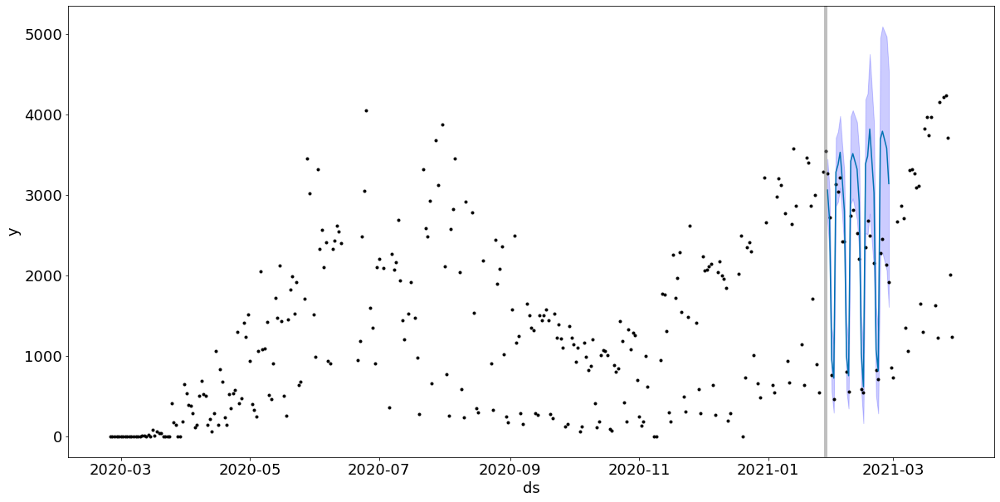

In [ ]:
cutoff = df_cv['cutoff'].unique()[janela]

df_cv_cut = df_cv[df_cv['cutoff'].values == cutoff]

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)
ax.plot(modelo_feriados.history['ds'].values, modelo_feriados.history['y'], 'k.')
ax.plot(df_cv_cut['ds'].values, df_cv_cut['yhat'], ls='-', c='#0072B2')
ax.fill_between(df_cv_cut['ds'].values, df_cv_cut['yhat_lower'],
               df_cv_cut['yhat_upper'], color='blue',
               alpha=0.2)
ax.axvline(x=pd.to_datetime(cutoff), c='gray', lw=4, alpha=0.5)
ax.set_ylabel('y')
ax.set_xlabel('ds')

Quando movemos a janela pra frente ele move a linha cinza, assim, todos os pontos antes dessa linha estão sendo usados para treino de um modelo que está sendo testado na janela a frente da linha cinza. Isso exemplica bem o que é feito internamente quando fazemos esse cross validation, a ideia é validar o nosso modelo com diversos exemplos.

O cross validation é uma ferramenta estatística para medir o quanto o nosso modelo está generalizando bem ou mal os nossos dados. Existem alguma técnicas para fazer isso e aqui no prophet temos na documentação uma seção só de diagnóstico explicando o que ele usa e o que faz o cross validation. No prophet usamos essa técnica de pegar uma janela, pular 30 dias e testar na próxima. Esse é um jeito, contudo, não é o único!

Nós já haviamos dividido nossa base dados em treino e teste, entretanto, isso não despensa o uso do cross validation ou de outras métricas. Somente dividir os dados em treino e teste não é suficiente para saber se o modelo generaliza bem os seus dados ou não.

Essa forma que utilizamos para fazer o cross validation é ótima para séries temporais porque elas são sequênciais, em alguns casos específicos usaremos formas de cross validation que separam os dados de forma aleatória.



In [ ]:
df_p = performance_metrics(df_cv)

INFO:prophet:Skipping MAPE because y close to 0


In [ ]:
df_p

,horizon,mse,rmse,mae,mdape,smape,coverage
0,3 days,65442.226772,255.816784,187.543992,0.127571,0.140201,0.944444
1,4 days,117210.138328,342.359662,259.828824,0.175333,0.302237,0.888889
2,5 days,110706.886616,332.726444,250.125813,0.180293,0.327700,0.888889
3,6 days,118158.486905,343.741890,267.764380,0.175142,0.348643,0.851852
4,7 days,64358.325064,253.689426,208.714527,0.118426,0.225268,0.944444
5,8 days,127329.720030,356.832902,296.236917,0.159831,0.262014,0.777778
6,9 days,112406.108857,335.270203,271.320342,0.139189,0.314029,0.833333
7,10 days,129892.341326,360.405801,306.236602,0.264739,0.426046,0.777778
8,11 days,97537.719678,312.310294,275.188996,0.169016,0.388181,0.888889
9,12 days,103206.003315,321.256912,265.323390,0.165322,0.271668,0.842593


Essas métricas mostram o quanto estamos errando em nossa previsão. Observamos que conforme o número de dias de previsão vai aumentando, o índice "mae" no geral vai crescendo, a parte de algumas variações locais, isso quer dizer que a nossa previsão quanto mais futura mais chance de estar errada tem.

### Desafio 2 - 5 - 3: Buscar quais métricas se aplicam a quais casos.

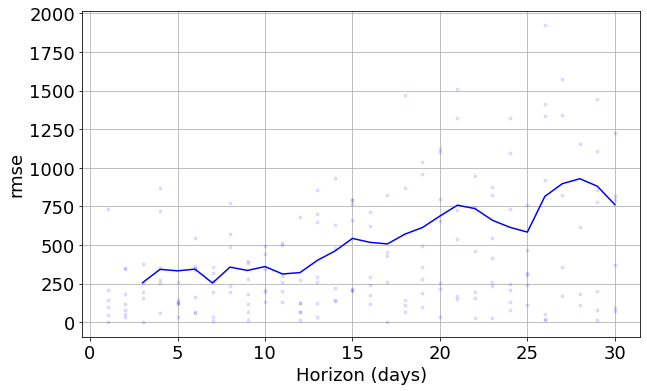

In [ ]:
#Vamos vizualizar graficamente essas métricas agora:

plot_cross_validation_metric(df_cv, metric='rmse');

#rmse = root mean square error

Vemos através desse gráfico que para cada dia do horizonte ele está comparando todos os intervalos que nós dividimoms os dados e comparando o dia 1, 2, ... de cada janela com a previsão feita pelo modelo.

Percebemos que o erro também vai ficando mais disperso quanto maior o número de dias, e quanto menos disperso melhor é o nosso modelo.

A Karol fala que esse resultado de erro não é geral de todas as séries temporais, que estamos tratando dos casos de covid, dados "caóticos" e não estáveis, assim, se estivemos trabalhando com uma série temporal estabilizada, com dados de vários anos, nossos erros para previsões de 30 dias podem ser bem menores do que o que encontramos aqui.

# Desafio 2 - 5 - 3:

Falarei um pouco das métricas que usei:

- Mean absolute error (mae): Calculado a partir da equação:

$$MAE = \frac{\sum_{i=1}^{n}|y_i - x_i|}{n} $$ Onde $y_i$ é o valor da previsão e $x_i$ é o valor real da variável.

Ela usa a mesma escala dos dados que estão sendo medidos, assim, ela é uma medida de acurácia dependente da escala e então não pdoe ser usada para fazer comparações entre séries de diferente escalas. É normalmente usada para medir o erro da previsão em uma série temporal, ou seja, medir a diferença entre a previsão, advinda de seu modelo, do valor de uma variável e o real valor dessa variável.

ref: 

- R² - coeficiente de determinação : 

Já escrevi sua equação previamente. Esse coeficiente nos diz a proporção de variância de uma variável(y) advinda das diferentes variáveis independentes do modelo usado. Indica a qualidade do ajuste, assim, é uma medida do quão bom as amostras não dadas ao modelo podem ser previstas pelo modelo. Essa variação depende do conjunto de dados, logo, pode não ser significante na comparação entre conjuntos de dados diferentes. A melhor pontuação é 1,0 e pode ser negativa, se for negativo o modelo é bem ruim aparentemente.

- Median absolute error (MedAE): 

Semelhante ao previamente citado mae, só que agora com a mediana, não a média, assim, é particularmente interessante pela sua robustez diante outliers.

- Explained variance score:

Sua equação também já foi previamente citada. Esse índice mede o quão um dado modelo leva em consideração a variação(dispersão) dos dados de um conjunto de dados usado. Como é relacionado ao R² ele compartilha das desvantagens do mesmo e também reflete não apenas a qualidade da regressão ou modelo, mas também a distribuição das varáveis independetes.

- Mean square error (mse):

É basicamente a mesma matemática do mae só que com a subtração elevada ao quadrado:

$$MAE = \frac{\sum_{i=1}^{n}(y_i - x_i)²}{n} $$

É a medida de qualidade de um estimador ou modelo. Como é derivada da distância Euclidiana esse indicador é sempre positivo e é menor conforme menor o erro entre as medidas. Ou seja, é semelhante ao mae só que somente com valores positivos, quanto mais próximo de 0 melhor pois menor é o erro médio das suas medidas.

- Root mean square error  (rmse):

É apenas a raiz do Mean square error (mse)

- Median absolute percentage error (mdape):

É o MedAE em porcentagem.

- Symmetric mean absolute percentage error (smape):

É definido como :

$$SMAPE =\frac{1}{n} \frac{\sum_{i=1}^{n}|y_i - x_i|}{(|x_i| + |y_i|)/2} $$

Achei referências com outros definições matemáticas para o SMAPE, assim, não sei qual o prophet usa. Uma limitação do smape é que quando a previsão for realmente 0 a fórmula irá dizer que o erro é gigantesco por conta da forma a qual ela é definida. Ela é definida como uma medida de acurácia baseada em porcentagem.

- Coverage probability:

Na área estatística, essa métrica da a proporção de tempo no qual o intervalo de uma técnica que calcula intervalos de confiança contém o real valor de interesse.